# Introduction
This is the records of technical procedures to reproduce the work in the pape [Single-cell RNA-seq reveals new types of human blood dendritic cells, monocytes, and progenitors](http://science.sciencemag.org/content/356/6335/eaah4573.long). 

The selected paper revised the taxonomy of human blood dendritic cells (DCs) and monocytes by performing a single-cell study of ~2400 cells. By analyzing single-cell RNA- seq data of 768 DCs and 372 monocytes derived from a single healthy people (in total 1140 cells, referred to as ***discovery dataset*** in the following discussion), they identified a new subtype of DC, a new subdivision of a previous known subtype of DC, the existence of a conventional dendritic cell (cDC) progenitor and two additional subtypes of monocytes. The existence of these cell types are further confirmed in a subsequent study of additionally profiled ~1200 cells (referred to as ***validation dataset***). They also studied the function of these newly discovered cell types and revealed the relationship between some of them.

Here we focus on the analysis of dendritic cells (DCs) in the discovery dataset. Most of the analyses are performed using the R software package[`Seurat`](https://satijalab.org/seurat/) as the original paper did.

<div align=center>![](figures/paper.overview.png)

# Work flow

Here is the workflow of the analyzing procedure that we extracted from the given code. We followed this workflow step by step in our reproduction.
<div align=center>![](figures/work_flow1.png)

# Data description
Here is a brief summary of the available data in the paper.

In [1]:
library(ggpubr)
description = {}
description$Data.characteristic <- c('Number of cells','Number of genes','Cell preparation batch','Library preparation batch','Traditional cell classification')
description$Described = c(1140,26593,8,2,'768 DCs and 372 monocytes')
description$Provided = c(1140,26593,8,NA,'768 DCs and 372 monocytes')
description = as.data.frame(description)
description

Loading required package: ggplot2
Loading required package: magrittr


Data.characteristic,Described,Provided
Number of cells,1140,1140
Number of genes,26593,26593
Cell preparation batch,8,8
Library preparation batch,2,NA
Traditional cell classification,768 DCs and 372 monocytes,768 DCs and 372 monocytes


# Quality Control
The aim of the filtering step is to reduce the noise in the data by filtering out low-quality cells and low-frequency genes. First a threshold of gene abundance (reads count, FPKM, TPM or other abundance estimation) is given to decide whether a gene is expressed. The 'quality' of a cell is then defined as the number of genes detected in the cell. Similarly, the frequency of a gene means the number of cells that express the gene. The cutoff of low-frequency genes is usually selected as 3 cells or some fraction of total cells (say 0.5%). The cutoff of low-quality cells, however, is usually data-specific, depending on the sequencing depths and other factors.

The original paper selected ***3000*** genes and ***3*** cells (it is described in the paper that this cutoff is set as ***0.5%*** of the total number of cells. The cutoff used in the given code is 3) as cutoffs to filter out low-quality cells and low-frequency genes. To see why they chose set those parameters in the first place, we checked the distribution of gene numbers detected in each cells through violin plot. We observed a left 'tail' in the violin plot. Cells that distribute in the left tail were treated as low-quality ones. The boundary between the left tail and the main body, which was around ***3000*** in this case, was selected as the cutoff. It should be note that 1. there is no exact boundary between the tail and the main body in the violin plot, researchers tend to select some multiple of hundred around the boundary as the cutoff. 2. in some studies, especially droplet-based sequencing studies, cells in the right tail are also treated as low- quality since more than one cells may be wrapped by one droplet.

In [2]:
library(Seurat)
load('data/data.Vallani.RData')

Loading required package: cowplot

Attaching package: ‘cowplot’

The following object is masked from ‘package:ggpubr’:

    get_legend

The following object is masked from ‘package:ggplot2’:

    ggsave

Loading required package: Matrix


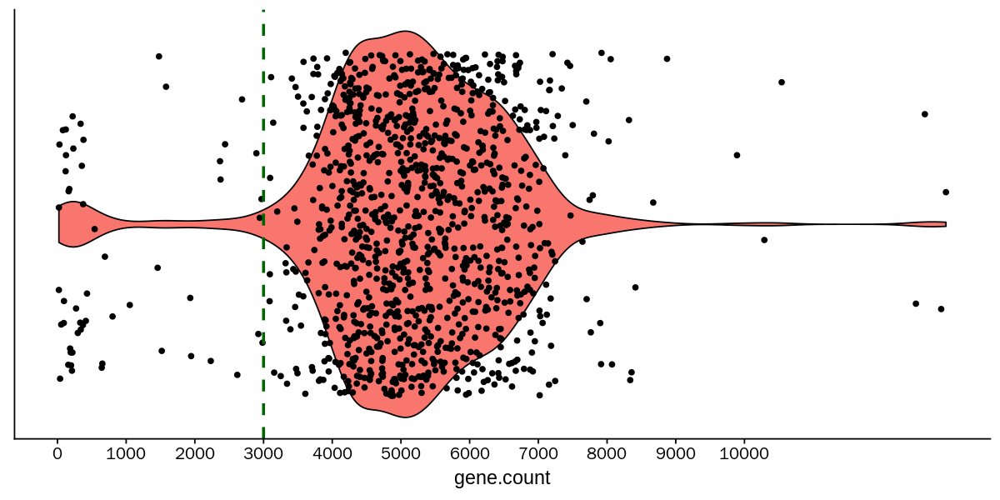

In [3]:
gene.count = colSums(data1>0)
options(repr.plot.width=10, repr.plot.height=5,repr.plot.res = 120)
ggplot(data.frame(gene.count = gene.count,cells = factor('cells')),aes(cells,gene.count)) + geom_violin(fill = '#F8766D',color = 'black') + 
  geom_jitter() + geom_hline(yintercept = 3000,linetype = 2,color = 'darkgreen',size = 1) + 
  coord_flip() + theme(axis.text.y = element_blank(),axis.title.y = element_blank(),axis.ticks.y = element_blank()) + scale_y_continuous(
      breaks = seq(0,10000,1000),labels = seq(0,10000,1000)
  )

In [4]:
# Create Seurat object
data = log(data1+1)
dcmono = CreateSeuratObject(data,min.cells = 3,min.genes = 3000,is.expr = 0,names.field = c(1),project = 'wib')
# add labels in the paper
all.label = read.table('data/data.Vallani.label.txt',header = T,row.names = 1,sep = '\t')
dcmono@meta.data[,'given.label'] = 'outlier'
dcmono@meta.data[row.names(all.label),'given.label'] = as.character(unlist(all.label))

The filtering step resulting in ***19996*** genes and ***1085*** cells,including ***336*** Monocytes and ***749*** DCs. This is slightly different from the results in the paper (see the table below). The following analysis are only based on the data of the ***749*** DCs.

In [5]:
description = {}
description$Data.characteristic <- c('Number of DCs','Number of monocytes','Number of genes')
description$Paper = c(NA,336,21581)
description$Reproduction = c(749,339,19996)
description = as.data.frame(description)
description

Data.characteristic,Paper,Reproduction
Number of DCs,NA,749
Number of monocytes,336,339
Number of genes,21581,19996


# Removing Batch Effect 
## Check batch effect
The DCs were profiled in ***8*** batches and the library preparation were carried out in 2 batches. To check if there is any batch effect in the data, we applied PCA to the whole data followed by t-SNE visualization. Below are the visualization results, colored by classical DC cell type, profiling batches, library preparation batches and the number of detected genes respectively (The library preparation batches information is not given in the paper, we inferred this based on the layout in the visualization of profiling batches). A weak batch effects were observed as the described in the paper. Besides, the layout of the visualization is also slightly biased by the number of genes detected in each cells.

In [6]:
levels.use=c("CD141", 'CD1C', 'DoubleNeg', 'pDC')
dcdat = SubsetData(dcmono,cells.use = WhichCells(dcmono,levels.use),do.scale = F)
dcdat@meta.data[,'batch'] = unlist(lapply(dcdat@cell.names,ExtractField,2))
## Visulization of the original data
dcdat = ScaleData(dcdat,do.scale = F,do.center = T)
dcdat = RunPCA(dcdat,pc.genes = row.names(dcdat@data),pcs.compute = 50,do.print = F)
dcdat = RunTSNE(dcdat,dims.use = 1:50, perplexity = 30)

#grouped by original cell type
p1 <- TSNEPlot(dcdat,group.by = 'orig.ident',do.return  = T)
#grouped by given batch
p2 <- TSNEPlot(dcdat,group.by = 'batch',do.return = T)
#grouped by guessed batch
dcdat@meta.data[,'guessed.batch'] = ifelse(dcdat@meta.data[,'batch'] %in% c('P7','P8','P10','P9'),'batch1','batch2')
p3 <- TSNEPlot(dcdat,group.by = 'guessed.batch',do.return = T)
#colored by detected gene number
cell.embedding.df = cbind(
  as.data.frame(dcdat@dr$tsne@cell.embeddings),
  dcdat@meta.data
)

p4 <- ggplot(cell.embedding.df,aes(tSNE_1,tSNE_2)) + geom_point(aes(color = nGene)) + 
  scale_color_continuous(low = 'grey',high = 'red') + theme_bw() + theme(
    panel.grid = element_blank()
  )

NormalizeData has not been run, therefore ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.
ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.


Scaling data matrix
Warning message in irlba(A = t(x = data.use), nv = pcs.compute, ...):
“did not converge--results might be invlaid!; try increasing work or maxit”

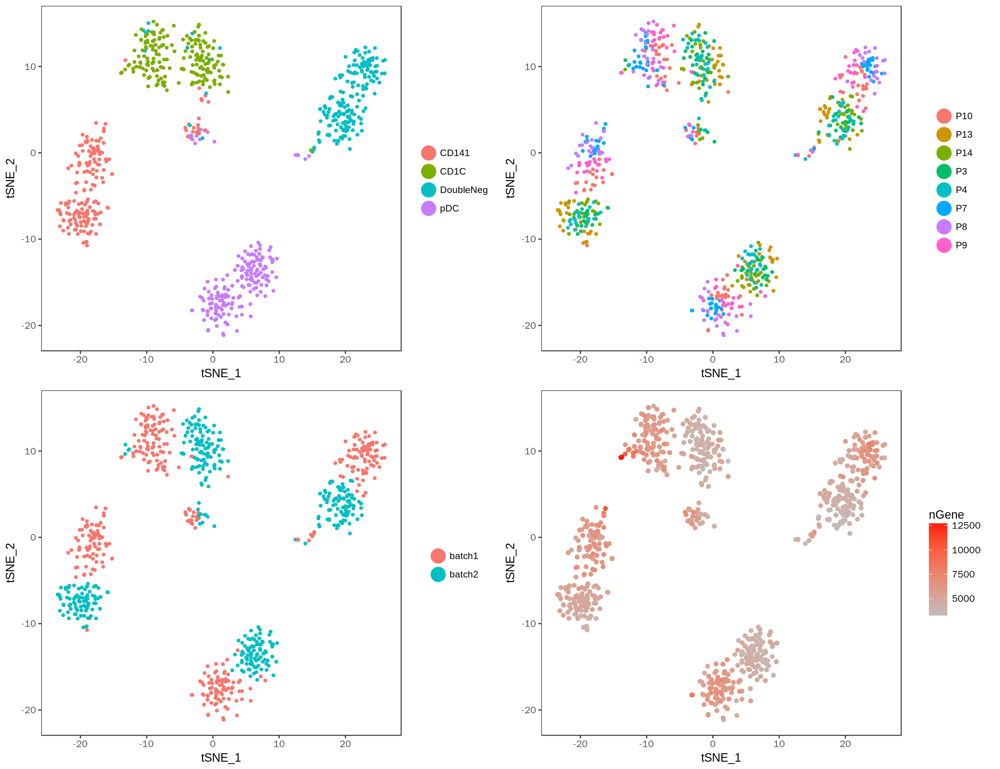

In [7]:
options(repr.plot.width=13, repr.plot.height=10,repr.plot.res = 200)
ggarrange(p1,p2,p3,p4,nrow = 2,ncol = 2,align = 'v')

## Remove the batch effect
To remove the batch effect and the effect of gene numbers, we regressed the gene expression using profiling batch indicator variable as well as the number of genes detected in the cell. The z-scored residuals are used as the adjusted gene expression for the downstream analyses. Below are the visualization for the adjusted data. Cells in different batches or with different detected genes numbers do not show distict patterns, indicating that effects caused by those confounding factors have been removed.

In [8]:
#Remove batch effect and visulizaiton 
dcdat=ScaleData(dcdat,vars.to.regress  = c("nGene","batch")) 
dcdat = RunPCA(dcdat,pc.genes = row.names(dcdat@data),pcs.compute = 50,do.print = F)
dcdat = RunTSNE(dcdat,dims.use = 1:50, perplexity = 30)

#grouped by original cell type
p1 <- TSNEPlot(dcdat,group.by = 'orig.ident',do.return  = T)
#grouped by given batch
p2 <- TSNEPlot(dcdat,group.by = 'batch',do.return  = T)
#grouped by guessed batch
p3 <- TSNEPlot(dcdat,group.by = 'guessed.batch',do.return  = T)
#colored by detected gene number
cell.embedding.df = cbind(
  as.data.frame(dcdat@dr$tsne@cell.embeddings),
  dcdat@meta.data
)

p4 <- ggplot(cell.embedding.df,aes(tSNE_1,tSNE_2)) + geom_point(aes(color = nGene)) + 
  scale_color_continuous(low = 'grey',high = 'red') + theme_bw() + theme(
    panel.grid = element_blank()
  )


NormalizeData has not been run, therefore ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.
ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.


Regressing out: nGene, batch



Time Elapsed:  25.634818315506 secs

Scaling data matrix
Warning message in irlba(A = t(x = data.use), nv = pcs.compute, ...):
“did not converge--results might be invlaid!; try increasing work or maxit”

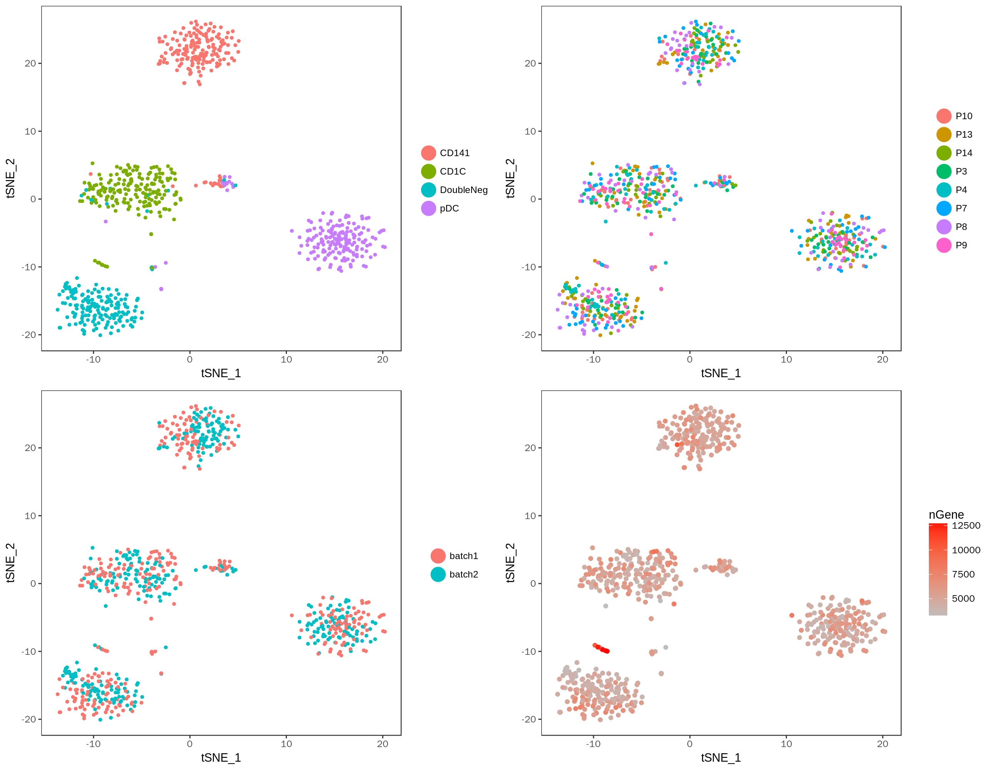

In [9]:
options(repr.plot.width=13, repr.plot.height=10,repr.plot.res = 200)
ggarrange(p1,p2,p3,p4,nrow = 2,ncol = 2,align = 'v')

# Gene selection and PCA (1)
In single cells studies, the gene expression matrix usually contains tens of thousands of genes. As we know, dealing with high-dimension data is usually computationally heavy. Besides, since not all genes are informative for the interested questions and many genes are high correlated in expression pattern, there is much redundancy in the high-dimension data. The aim of gene selection and dimension reduction is to remove redundancy in the data to improve the performance of downstream analysis.

Gene selection removes redundancy in the data by selecting informative genes. One common strategy to measure the informativity of a gene is to calculate the variability in its gene expression pattern across cells. The variance-to-mean ratio or dispersion is usually involved in those calculations.

We did the first round of gene selection and PCA as the paper did. PCA was conducted on the 563 selected high variable genes. To grab an intuition of the dimension reduction results, we visualized PC1 to PC5 through both density plot and pair-wise scatter plot (colored by classical DC cell types). We got the following observations:
- PC1 to PC3 has good discriminative power for the classical DC cell types.
- Seven cells appear to be outliers in PC4.
- In PC5, other than the coincided main peaks for the classical DC cell type, there are
some small peaks.


[1] 563

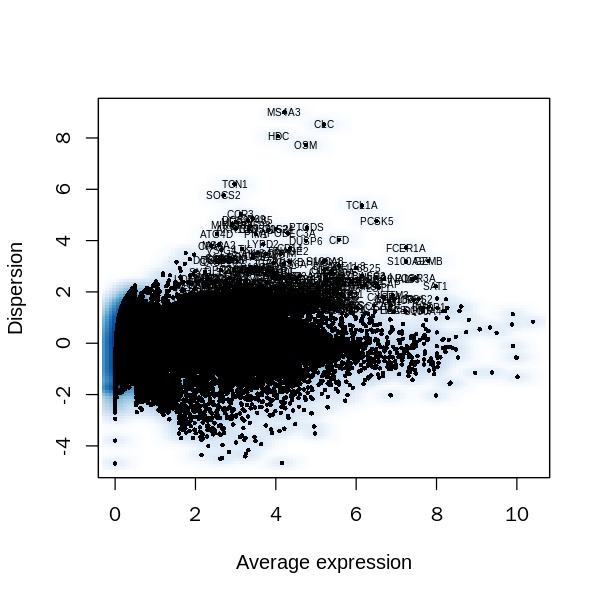

In [10]:
# Gene selection
options(repr.plot.width=5, repr.plot.height=5,repr.plot.res = 120)
dcdat=FindVariableGenes(dcdat,mean.function = ExpMean,dispersion.function = LogVMR,x.low.cutoff = 2,x.high.cutoff = 8,y.high.cutoff = 30,y.cutoff = 1.25,do.contour = F)
length(dcdat@var.genes)
#save variable genes
genelist1 = dcdat@var.genes

Loading required package: GGally


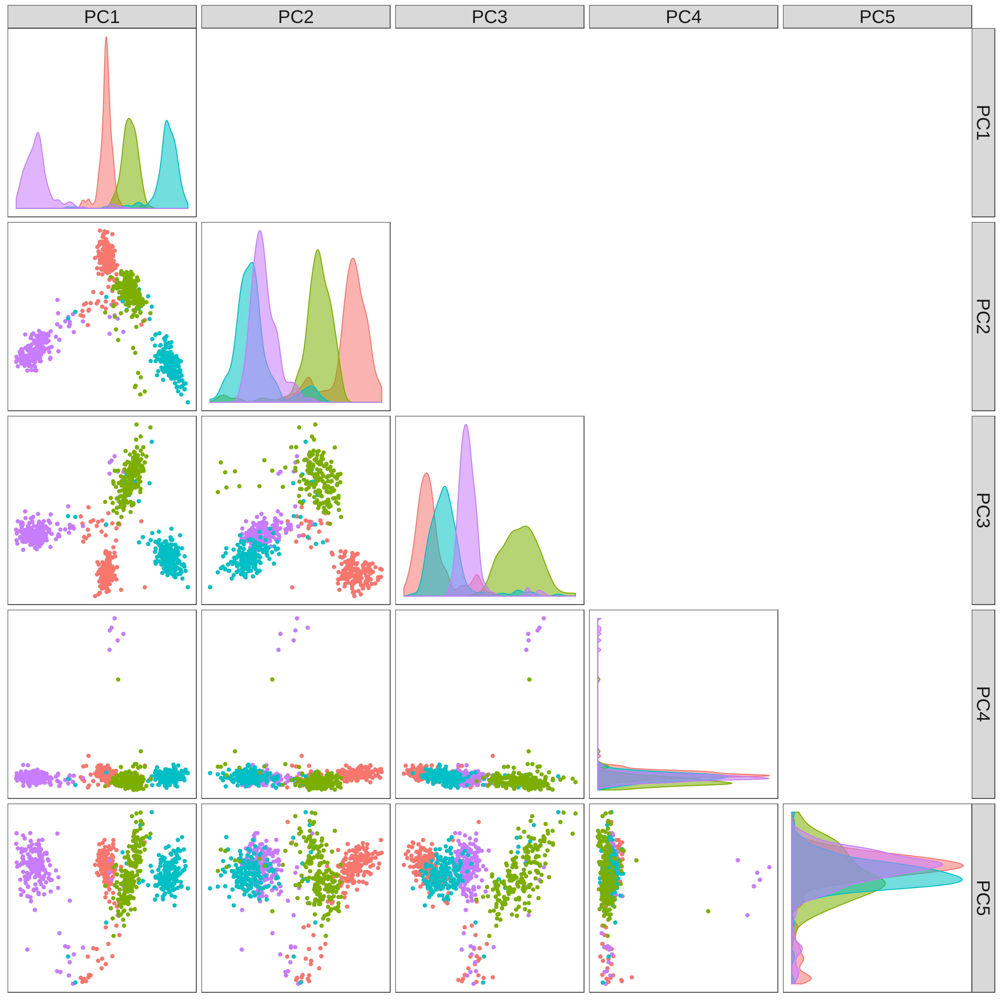

In [11]:
#PCA 
dcdat = RunPCA(dcdat,pcs.compute = 10,do.print = F)
cell.embedding.df = cbind(
  as.data.frame(dcdat@dr$pca@cell.embeddings),
  dcdat@meta.data
)
require(GGally)
p <- ggpairs(
  cell.embedding.df,
  columns = 1:5,
  lower = list(
    continuous = 'points',
    mapping = aes(colour = orig.ident,fill = orig.ident),
    size = 0.5),
  diag = list(mapping = aes(colour = orig.ident,fill = orig.ident,alpha = 0.2)),
    upper = NULL) + 
  theme_bw() + theme(
  panel.grid = element_blank(),
  axis.text = element_blank(),
  axis.ticks = element_blank(),
  strip.text = element_text(size = 20) 
)
p[4,4] = p[4,4] + coord_flip()
p[5,5] = p[5,5] + coord_flip()
options(repr.plot.width=15, repr.plot.height=15,repr.plot.res = 200)
p

# Remove containminating subpopulations

**Novel or containminating subpopulaitons?**

In the original paper, the outliers in PC4 were removed as contaminating subpopulations. The paper also provides two genes as the marker gene of the contaminating subpopulations. Before doing so, how can we decide the outliers are contaminating subpopulations rather than a new cell type in the first place? A straightforward way is to do the differential gene expression detection between the outliers and other cells. The identity of the outliers can then be possibly decided by the detected marker genes. Another easier way is to check the gene loadings of the PCA results as follows.

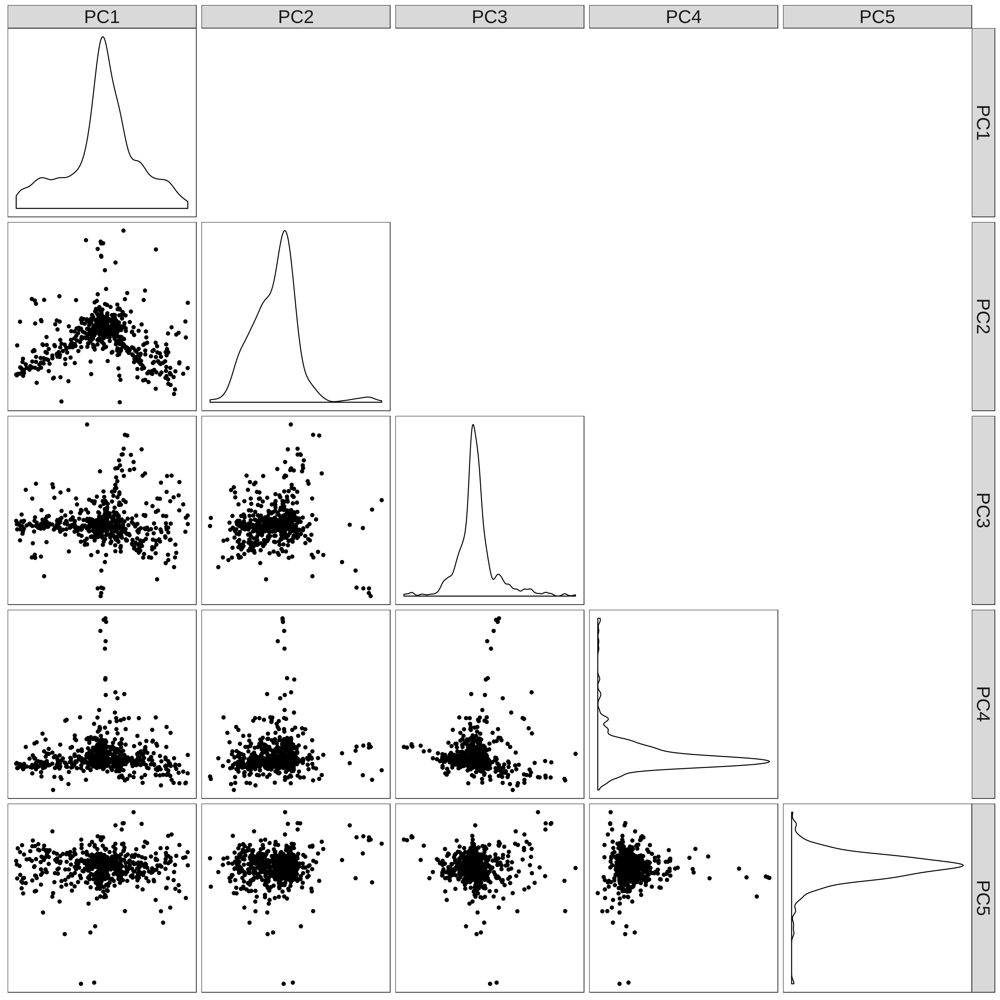

In [12]:
gene.loading.df = cbind(
  as.data.frame(dcdat@dr$pca@gene.loadings)
)

p <- ggpairs(
  gene.loading.df,
  columns = 1:5,
  lower = list(
    continuous = 'points',
#    mapping = aes(colour = orig.ident,fill = orig.ident),
    size = 0.5),
#  diag = list(mapping = aes(colour = orig.ident,fill = orig.ident,alpha = 0.2)),
    upper = NULL) + 
  theme_bw() + theme(
  panel.grid = element_blank(),
  axis.text = element_blank(),
  axis.ticks = element_blank(),
  strip.text = element_text(size = 20) 
)
p[4,4] = p[4,4] + coord_flip()
p[5,5] = p[5,5] + coord_flip()
options(repr.plot.width=15, repr.plot.height=15,repr.plot.res = 200)
p


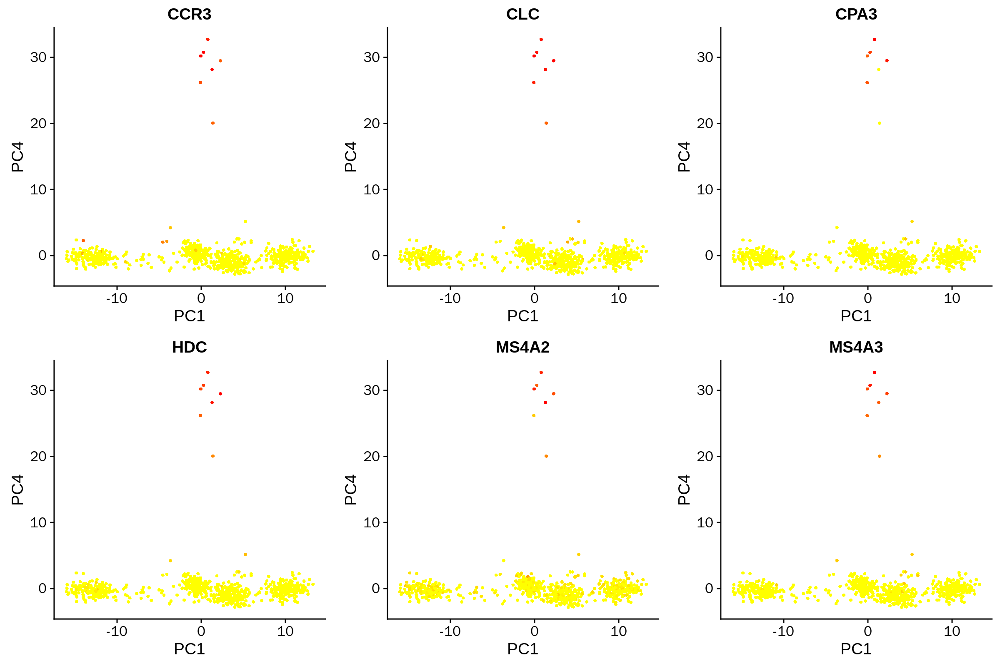

In [13]:
# Remove outliers
options(repr.plot.width=12, repr.plot.height=8,repr.plot.res = 200)
FeaturePlot(dcdat,features.plot = c('CCR3','CLC','CPA3','HDC','MS4A2','MS4A3'),reduction.use = 'pca',dim.1 = 1,dim.2 = 4,nCol = 3)

In [14]:
# PCA can given opposite PCs (which are equivalent to keep variance)
# The cutoff in the original code is accepted.hihg = 0.2, this is because they showed the results on the unit vector of 
# PCs that are not weighted by the variance of  that corresponding PCs.
#dcdat = SubsetData(dcdat,subset.name = 'PC4',accept.low = -15,do.scale = F)
dcdat = SubsetData(dcdat,subset.name = 'PC4',accept.high = 15,do.scale = F)

In the gene loading plots, there appears some outlier genes in ***PC4***, which apparently are the "markers" for the outlier cells in the original PCA plots. We illustrated this in the following figures. Each dot represents a cell, the y-axis represents the unnormalized cell loadings in PC4 and the color stands for the expression level of the selected gene in that cell. "***CLC***" and "***MS4A2***", two maker genes for the contaminating subpopulations given in the paper, are among those outlier genes. We removed those contaminating subpopulations according to cell loadings in PC4, leaving ***742*** DC cells for the downstream analysis.

# Gene selection and PCA (2)
After removing the contaminating subpopulations, we redo the gene selection and PCA as in the paper, using the same method but with a different set of parameters. This step resulted in ***1531*** selected high variable genes which PCA were conducted on.

[1] 1531

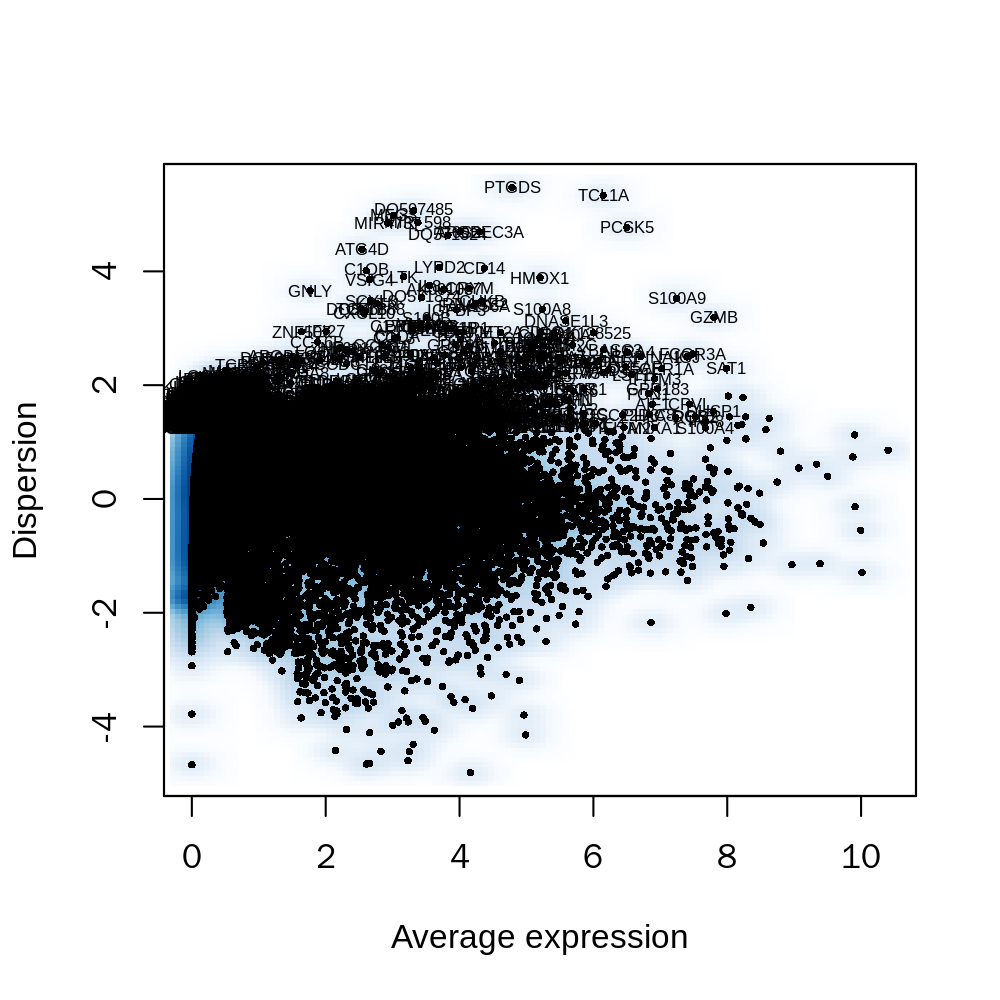

In [15]:
options(repr.plot.width=5, repr.plot.height=5,repr.plot.res = 200)
dcdat=FindVariableGenes(dcdat, mean.function = ExpMean,dispersion.function = LogVMR,x.low.cutoff = 0.1, x.high.cutoff = 8, y.high.cutoff = 30, y.cutoff = 1.25, do.contour = F)
length(dcdat@var.genes)
#save variable genes
genelist2 = dcdat@var.genes
dcdat = RunPCA(dcdat,do.print = F)

# Gene Selection and PCA (3)

The code given in the paper shows that another round of PCA and gene selection were conducted before t-SNE visualization and clustering. A randomization method called ***jack straw*** was used to identify ***statistically significant*** PCs and genes that contributed significantly to those selected PCs were used for the downstream dimension reduction and clustering analysis. This step results in ***~400*** selected genes (This step is stochastic so the number may change slightly between different runs).

  |======================================================================| 100%
Time Elapsed:  58.9587996006012 secs 



Warning message:
“Removed 12426 rows containing missing values (geom_point).”

An object of class seurat in project wib 
 19996 genes across 742 samples.

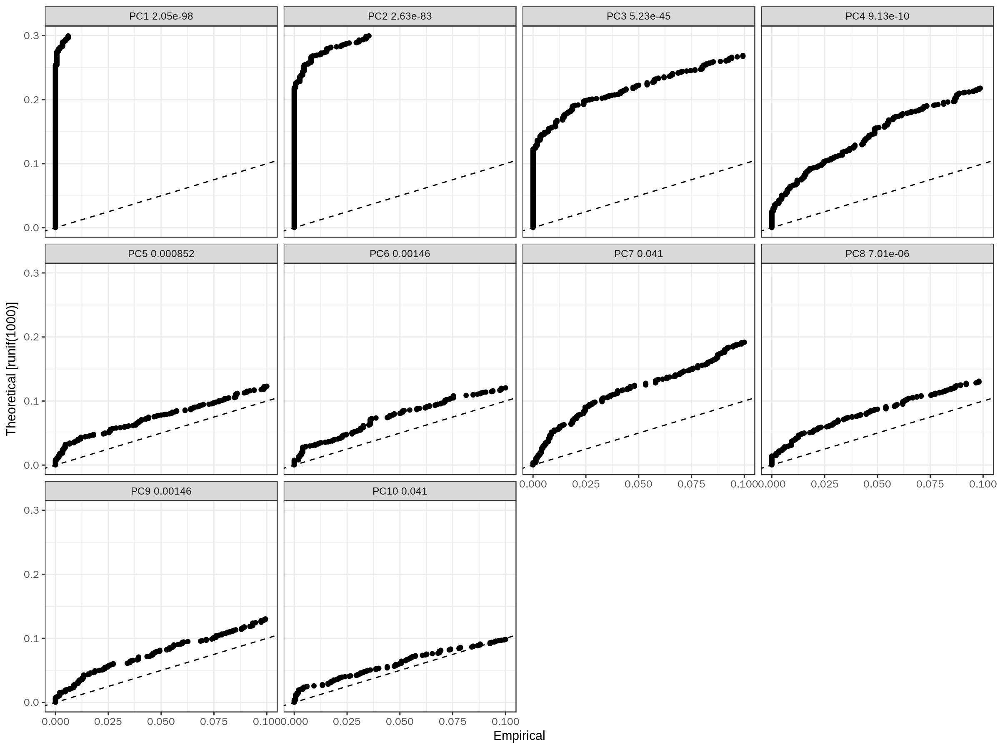

In [16]:
dcdat = JackStraw(dcdat,, num.replicate = 100)
options(repr.plot.width=12, repr.plot.height=9,repr.plot.res = 200)
JackStrawPlot(dcdat, PCs = 1:10,nCol = 4)

In [17]:
dcdat = ProjectPCA(dcdat,do.print = F)
genelist3 = PCASigGenes(dcdat,pcs.use = 1:5,pval.cut = 1e-10,max.per.pc = 200)
dcdat = RunPCA(dcdat,pc.genes = genelist3,do.print = F)

# Clustering and tSNE
Graph-based clustering and t-SNE visualization were conducted after PCA. The original paper does not provide the exact code for clustering DCs but for the clustering of a combined analysis of DCs and monocytes. We use the first five PCs to construct the clustering as described in the paper and the parameter ***resolution*** was set ***1.4*** as in the combined analysis of DCs and monocytes. We conducted t-SNE on the first ***five PCs*** achieved in the previous steps with the ***perplexity 96*** as in the paper.

In [27]:
mcols = c('#2BBDC2','#F27E22','#34B64B','#7191CC','#F2766E','#C96BAC','#F7D729','#3DAAE1','#602390','#D7006F')
mcols1 = c('#2BBDC2','#F27E22','#34B64B','#7191CC','red','#C96BAC','#F7D729','#3DAAE1','#602390','#D7006F')
source('Evaluation.R')

In [19]:
dcdat = RunTSNE(dcdat,dims.use = 1:5,tsne.method = 'Rtsne',perplexity = 96, max_iter = 1000)
dcdat = FindClusters(dcdat,reduction.type = 'pca',k.param = 30,dims.use = 1:5,algorithm = 3,force.recalc = T,resolution = 1.4,print.output = F)

# Evaluation

We compared the reproduced results and the original results of three aspects, **the visualization, the cell type assignments  and the cell-type-specific marker genes.** 

## T-SNE visualization
We conducted tSNE on the first five PCs achieved in previou steps with the perplexity 96 as in the paper. The dots are colored by the orginal label in the paper and the reproduced label seperately in the following figures.

In [28]:
r = evaluateClusterings (dcdat@ident,dcdat@meta.data[,'given.label'])
current.ids <-as.character(unlist(r$external.eval$aligned.label[,1]))
mapped.ids <- as.character(unlist(r$external.eval$aligned.label[,2]))
dcdat@meta.data[,'calculated.label']=factor(mapvalues(x = as.vector(dcdat@ident),from = current.ids,to = mapped.ids),levels = paste('DC',1:6,sep = ''))
p1 <- TSNEPlot(dcdat,do.label = F,colors.use = mcols1,group.by = 'given.label',do.return = T)
p2 <- TSNEPlot(dcdat,colors.use = mcols1,group.by = 'calculated.label',do.return = T)
#ggarrange(p1,p2,widths = c(1,1),ncol = 2,align = 'v')

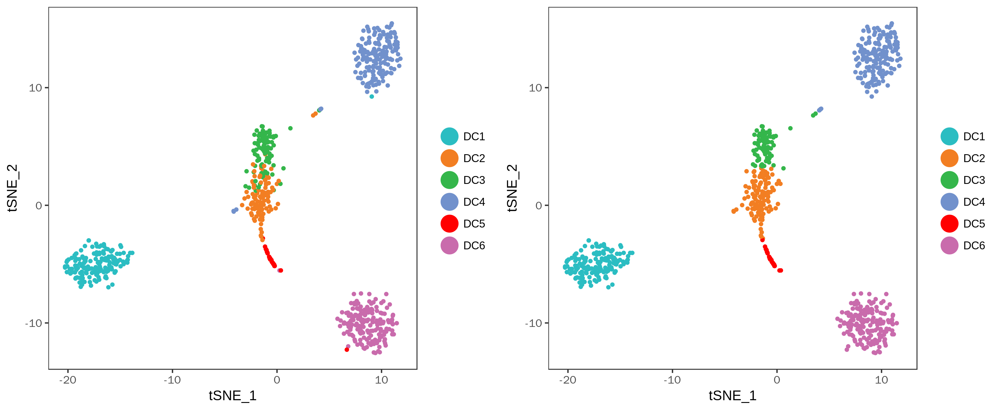

In [30]:
options(repr.plot.width=11, repr.plot.height=4.5,repr.plot.res = 300)
plot_grid(p1,p2)

## Cell assignments
Below are the comparison of cell type assignments. Cell types are aligned based on the Jaccard distance between original clusters and reproduced clusters.

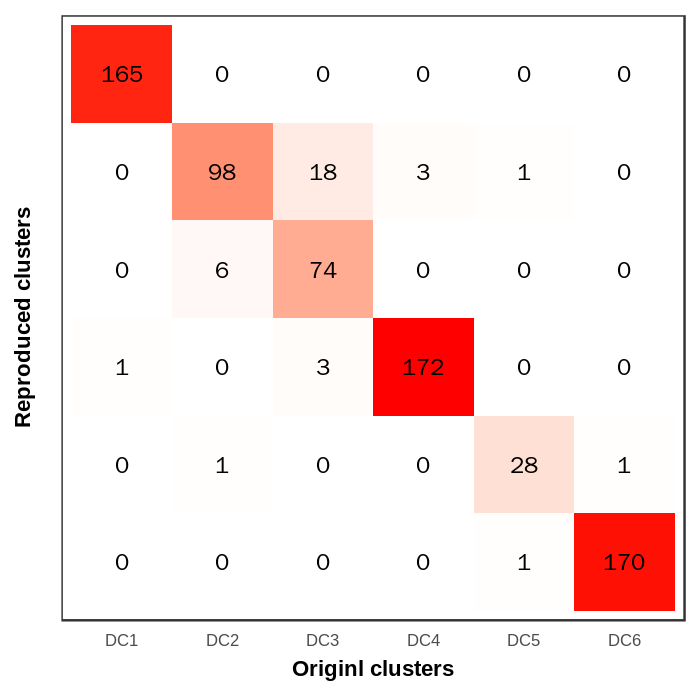

In [41]:
options(repr.plot.width=3.5, repr.plot.height=3.5,repr.plot.res = 200)
r$external.eval$m.plot

## Cell type-specific markers
### Marker gene overlap
We first identified cell type-specific clusters for the reproduced cell types based on AUC scores as in the paper. Then we compared marker genes with $AUC \ge 0.85$ between original results and reproduced results.

In [35]:
given.markers = read.table('data/AllMarkers.txt',sep = '\t',header = T)
given.markers.count = table(with(given.markers,Cluster.ID[AUC.value>=0.85]))
#Find markers
dc.markers = FindAllMarkers(dcdat,test.use = 'roc')
dc.markers$cluster = as.character(mapvalues(dc.markers$cluster,current.ids,mapped.ids))
#save(dc.markers,file = 'data/dc.markers.RData')
#load('data/dc.markers.RData')
calculated.markers.count =table(with(dc.markers,cluster[myAUC>=0.85]))


In [36]:
#compare markers
overlap.marker.count = {}
top5.overlap.marker.count = {}
for(i in 1:6){
  dc.cluster.marker = with(dc.markers,gene[myAUC>=0.85 & cluster == paste('DC',i,sep = '')])
  given.cluster.marker = with(given.markers,Gene.ID[AUC.value>=0.85 & Cluster.ID == paste('DC',i,sep = '')])
  overlap.marker.count[paste('DC',i,sep = '')] = length(intersect(dc.cluster.marker,given.cluster.marker))
  top5.overlap.marker.count[paste('DC',i,sep = '')] = length(intersect(head(dc.cluster.marker,n=5),head(given.cluster.marker,n=5)))
}
marker.comparison = rbind(
  given.markers.count,
  calculated.markers.count,
  overlap.marker.count,
  top5.overlap.marker.count
)
marker.comparison

,DC1,DC2,DC3,DC4,DC5,DC6
given.markers.count,37,3,12,86,12,92
calculated.markers.count,45,4,16,85,8,92
overlap.marker.count,36,3,11,82,8,90
top5.overlap.marker.count,5,3,4,4,5,4


### Heatmap of reproduced marker genes

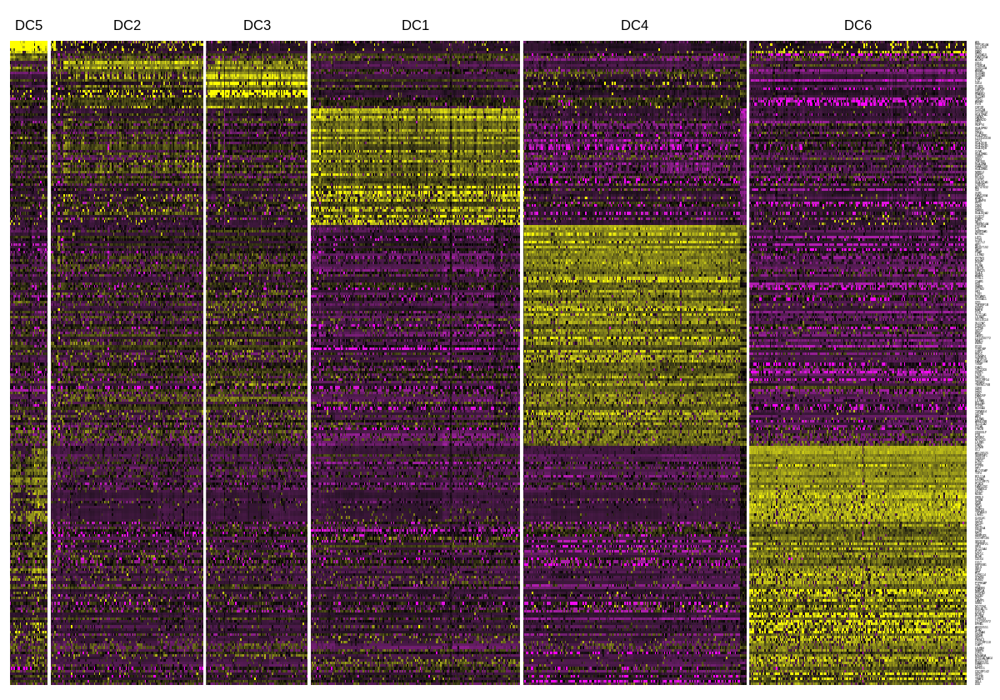

In [37]:
sig.gene = rbind(
  dc.markers[dc.markers$myAUC>=0.85 & dc.markers$cluster=='DC5',],
  dc.markers[dc.markers$myAUC>=0.85 & dc.markers$cluster=='DC2',],
  dc.markers[dc.markers$myAUC>=0.85 & dc.markers$cluster=='DC3',],
  dc.markers[dc.markers$myAUC>=0.85 & dc.markers$cluster=='DC1',],
  dc.markers[dc.markers$myAUC>=0.85 & dc.markers$cluster=='DC4',],
  dc.markers[dc.markers$myAUC>=0.85 & dc.markers$cluster=='DC6',]
)
gene.use = sig.gene$gene
options(repr.plot.width=10, repr.plot.height=7,repr.plot.res = 120)
DoHeatmap(dcdat,genes.use = gene.use,slim.col.label = TRUE, remove.key = TRUE,
          group.label.loc = 'top',group.cex = 10,cex.row = 2,group.by = 'calculated.label' ,
          group.order = c('DC5','DC2','DC3','DC1','DC4','DC6'))

Here is the original heatmap of marker genes in the paper
<img src = 'figures/original.heatmap.png'>

### Expression patterns of marker genes

Here we show the expression patterns of the top 10 marker (ranked by AUC) given by the original paper and our reproduction.

In [38]:
dc.markers %>% group_by(cluster) %>% top_n(10, myAUC) -> calculated.top10
given.markers %>% group_by(Cluster.ID) %>% top_n(10, AUC.value) -> given.top10

**DC1**

The original results and the reproduced results given the same top 10 markers for DC1.

[1] 10

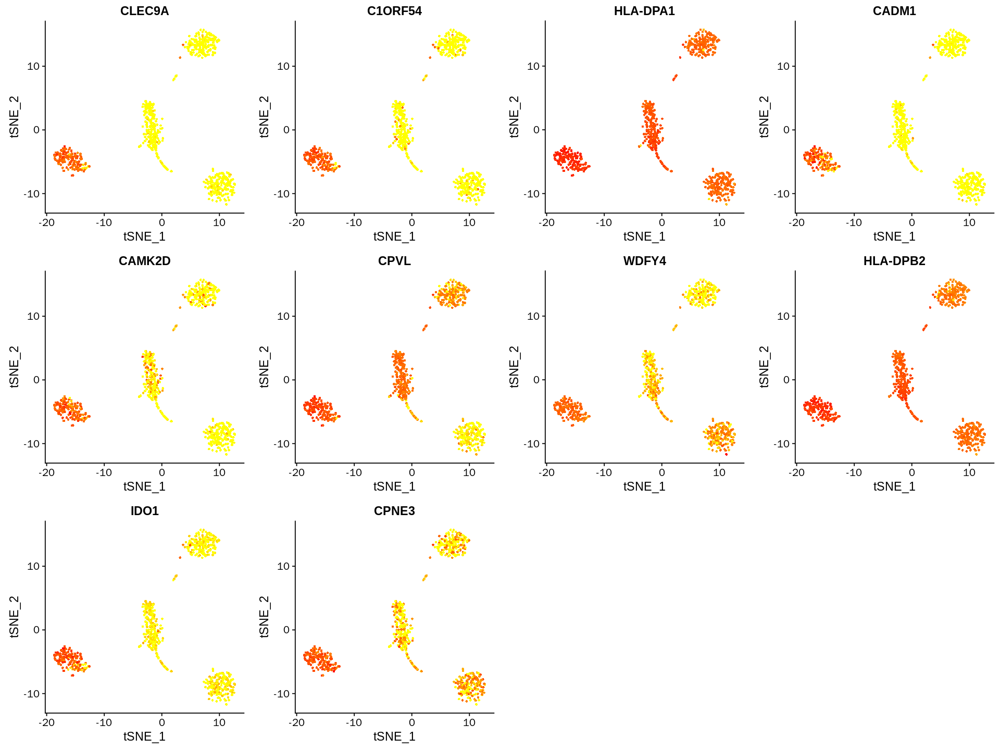

In [69]:
dc1.given.top10 = given.top10[given.top10$Cluster.ID == 'DC1',]
dc1.calculated.top10 = calculated.top10[calculated.top10$cluster == 'DC1',]
length(union(dc1.calculated.top10$gene,dc1.given.top10$Gene.ID))
options(repr.plot.width=16, repr.plot.height=12,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc1.calculated.top10$gene,nCol = 4)

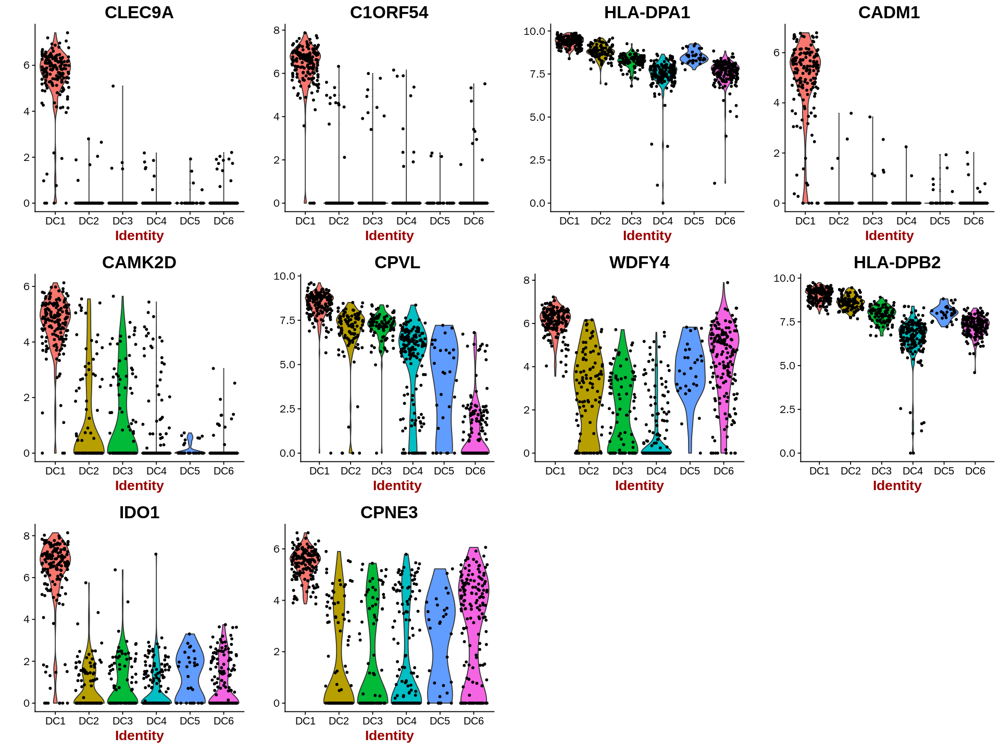

In [70]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc1.calculated.top10$gene,do.return = T,nCol = 4)

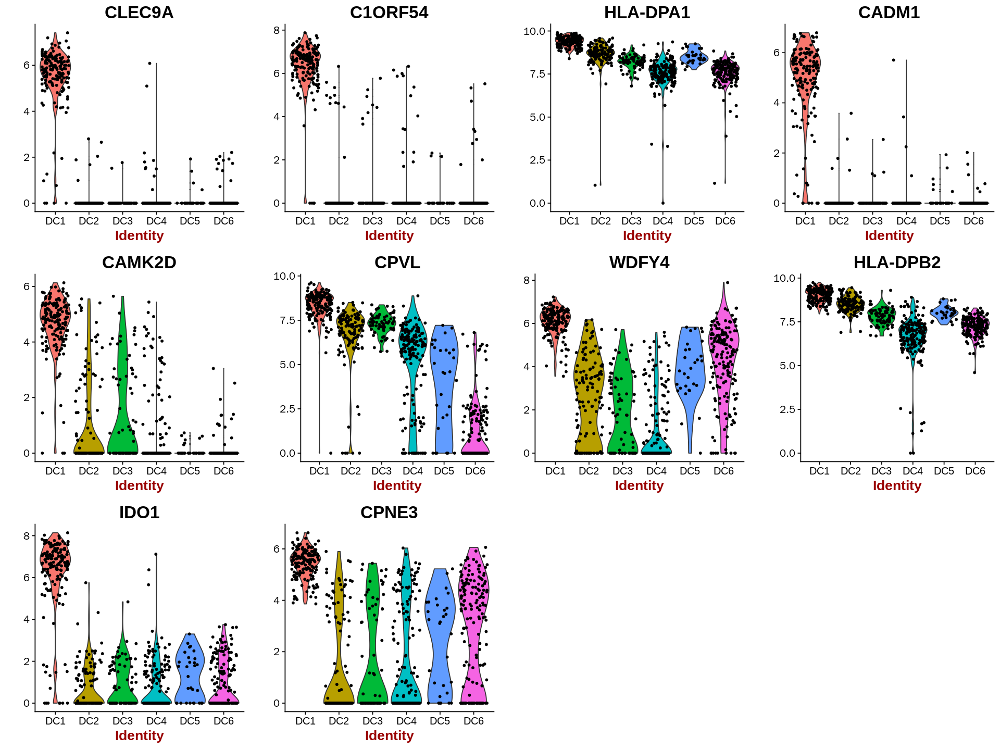

In [71]:
VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc1.calculated.top10$gene,do.return = T,nCol = 4)

**DC2**

The original results and the reproduced results given slightly different top 10 markers for DC2.

Loading required package: grid
Loading required package: futile.logger

Attaching package: ‘VennDiagram’

The following object is masked from ‘package:ggpubr’:

    rotate



(polygon[GRID.polygon.5369], polygon[GRID.polygon.5370], polygon[GRID.polygon.5371], polygon[GRID.polygon.5372], text[GRID.text.5373], text[GRID.text.5374], text[GRID.text.5375], text[GRID.text.5376], text[GRID.text.5377]) 

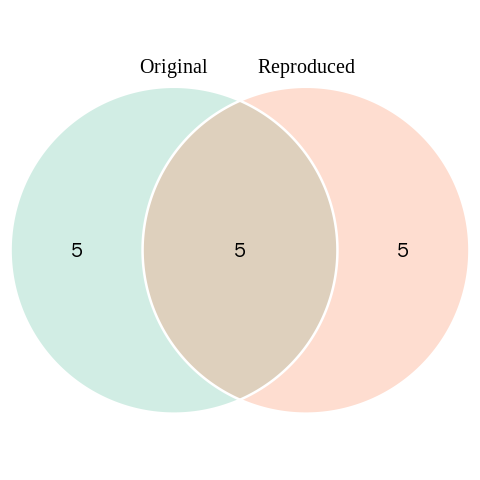

In [42]:
dc2.given.top10 = given.top10[given.top10$Cluster.ID == 'DC2',]
dc2.given.top10 = dc2.given.top10[1:10,]
dc2.calculated.top10 = calculated.top10[calculated.top10$cluster == 'DC2',]
dc2.calculated.top10 = dc2.calculated.top10[1:10,]
library(VennDiagram)
options(repr.plot.width=4, repr.plot.height=4,repr.plot.res = 120)
draw.pairwise.venn(10, 10, length(intersect(dc2.calculated.top10$gene,dc2.given.top10$Gene.ID)), category = c("Original", "Reproduced"),  fill =c("#66C2A5","#FC8D62"), alpha = 0.3, cat.pos = c(0, 
    0), cat.dist = rep(0.025, 2),col = 'white')

DC2—maker genes given by both original result and reproduce result

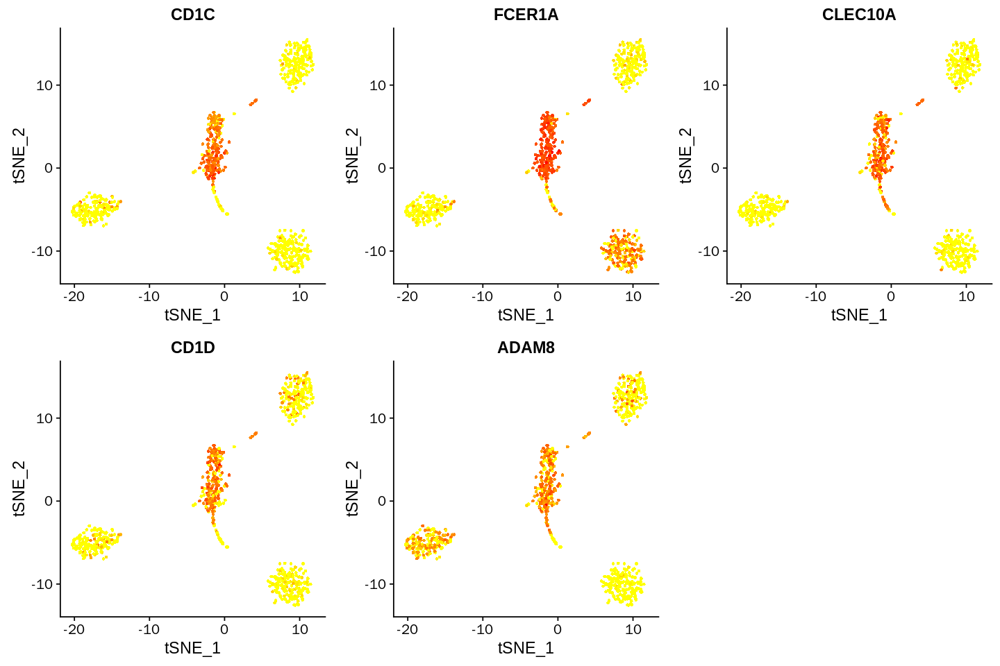

In [43]:
dc2.both = intersect(dc2.calculated.top10$gene,dc2.given.top10$Gene.ID)
options(repr.plot.width=12, repr.plot.height=8,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc2.both,nCol = 3)

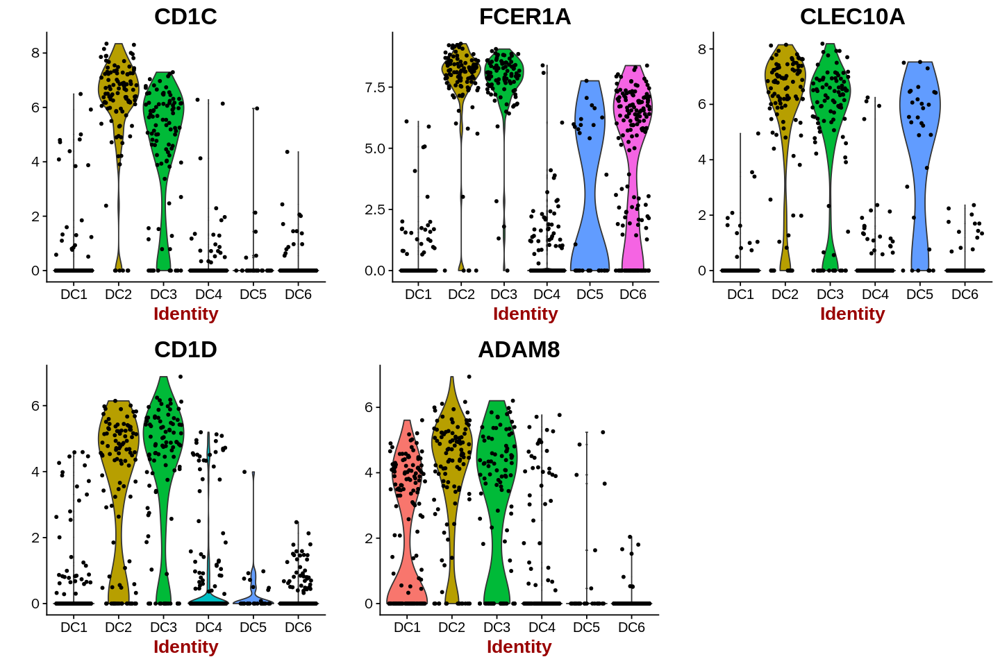

In [44]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc2.both,do.return = T,nCol = 3)

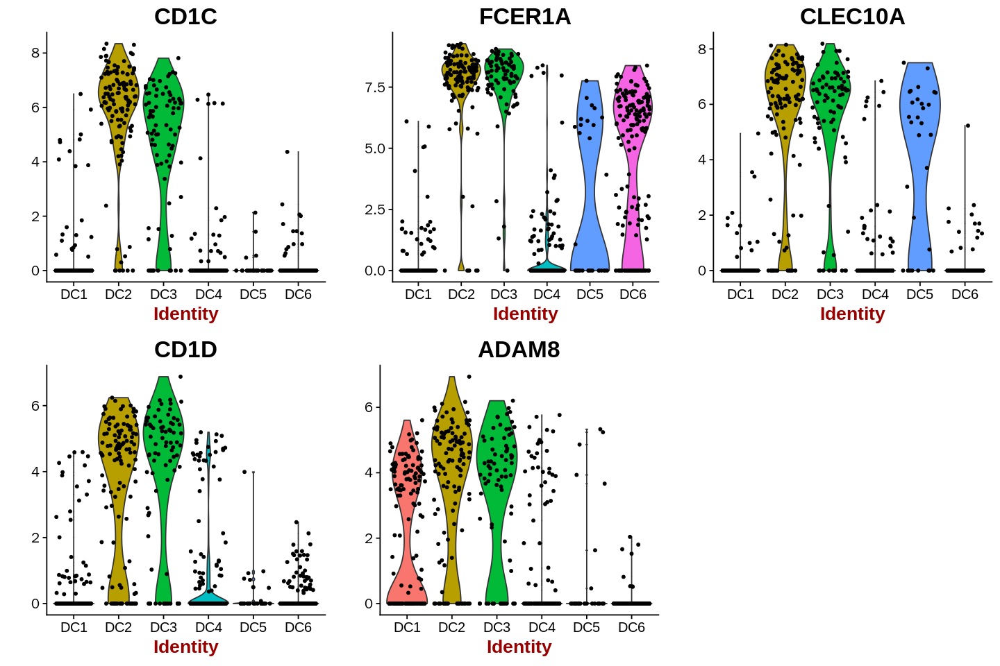

In [45]:
VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc2.both,do.return = T,nCol = 3)

DC2—maker genes given only by original result

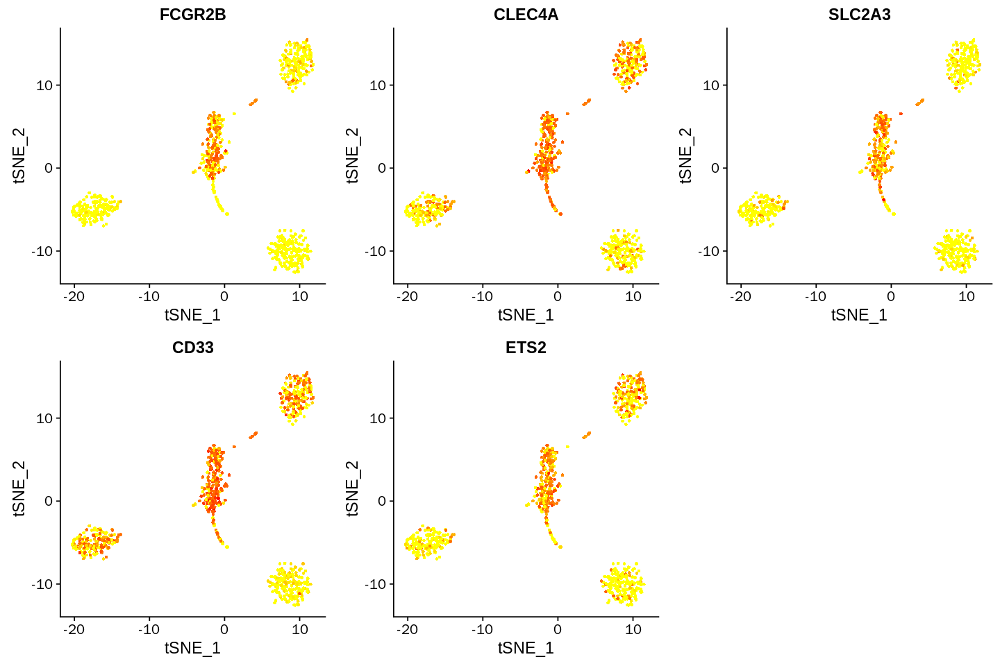

In [46]:
dc2.given.only = setdiff(dc2.given.top10$Gene.ID,dc2.calculated.top10$gene)
options(repr.plot.width=12, repr.plot.height=8,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc2.given.only,nCol = 3)

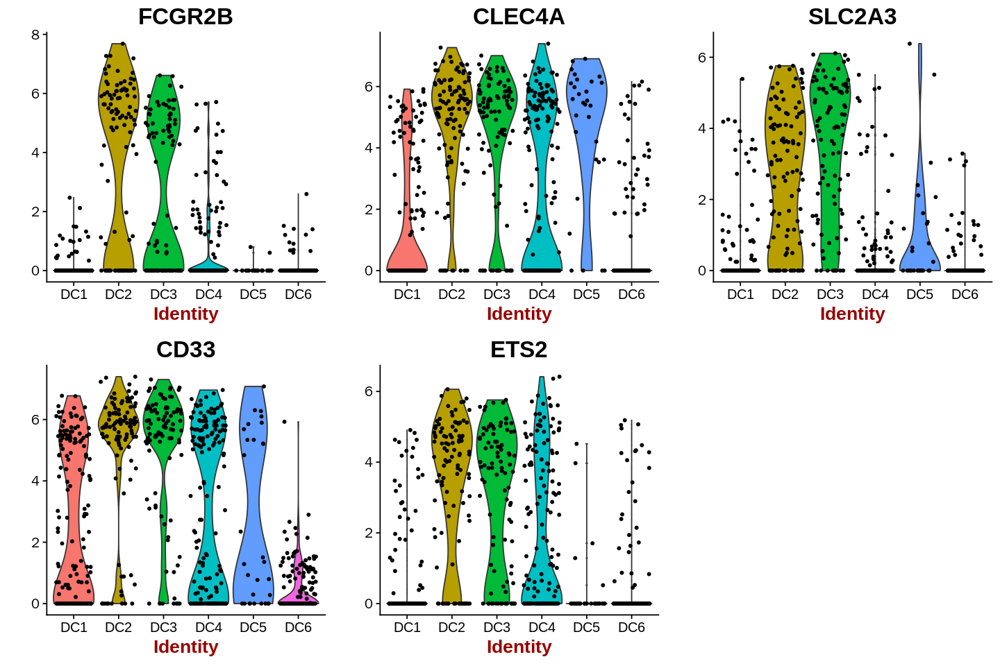

In [47]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc2.given.only,do.return = T,nCol = 3)

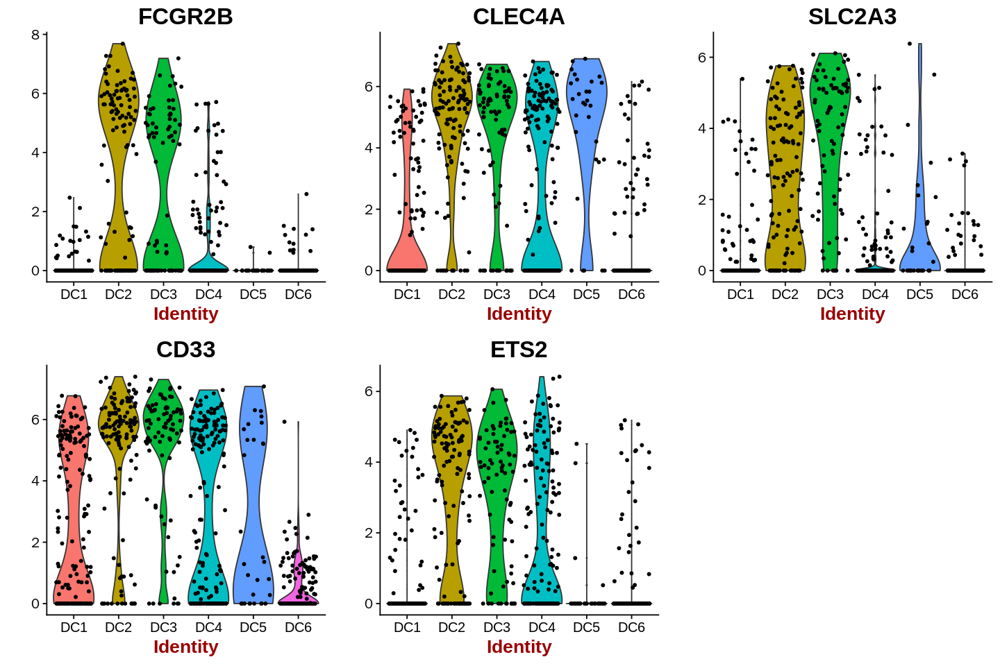

In [48]:
VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc2.given.only,do.return = T,nCol = 3)

DC2—maker genes given only by reproduced result

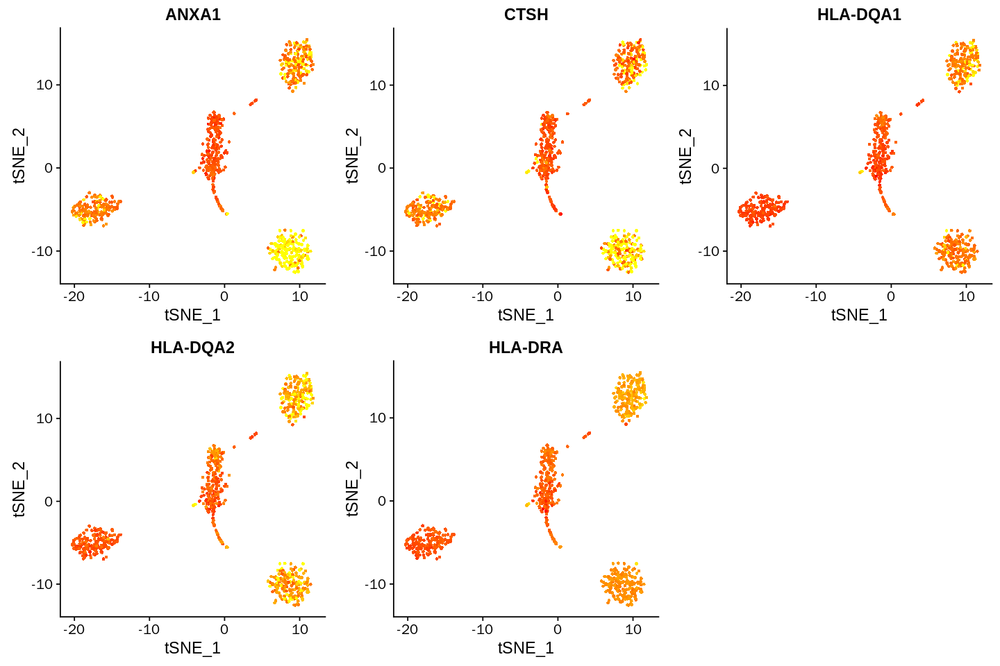

In [49]:
dc2.calculated.only = setdiff(dc2.calculated.top10$gene,dc2.given.top10$Gene.ID)
options(repr.plot.width=12, repr.plot.height=8,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc2.calculated.only,nCol = 3)

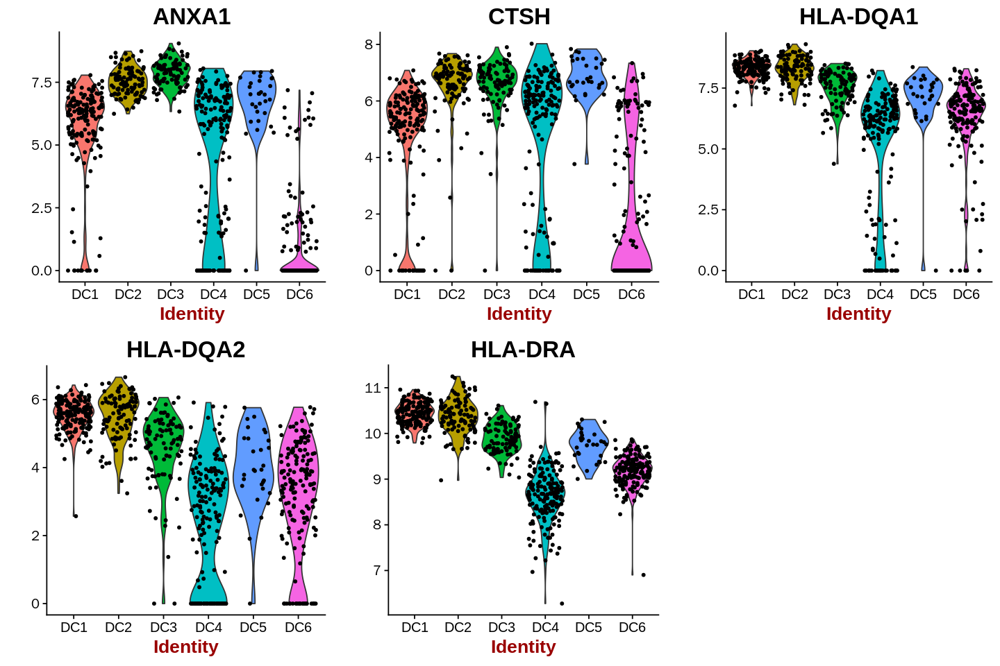

In [50]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc2.calculated.only,do.return = T,nCol = 3)

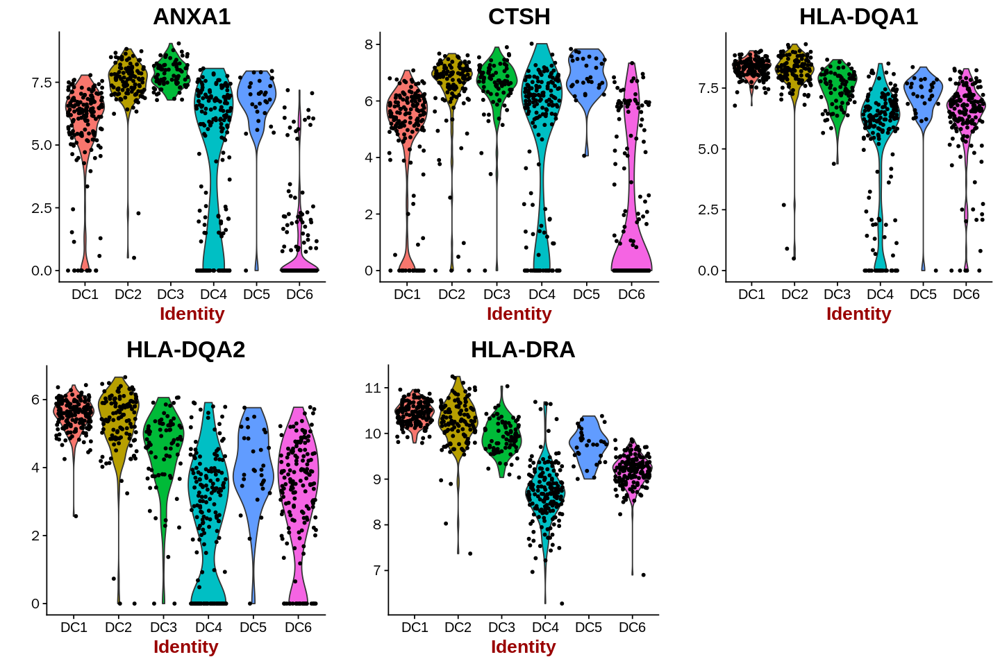

In [51]:
VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc2.calculated.only,do.return = T,nCol = 3)

**DC3 marker genes**

The original results and the reproduced results given slightly different top 10 markers for DC3.

(polygon[GRID.polygon.7946], polygon[GRID.polygon.7947], polygon[GRID.polygon.7948], polygon[GRID.polygon.7949], text[GRID.text.7950], text[GRID.text.7951], text[GRID.text.7952], text[GRID.text.7953], text[GRID.text.7954]) 

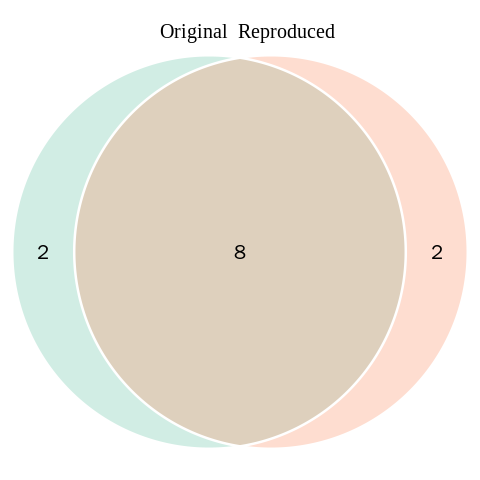

In [52]:
dc3.given.top10 = given.top10[given.top10$Cluster.ID == 'DC3',]
dc3.given.top10 = dc3.given.top10[1:10,]
dc3.calculated.top10 = calculated.top10[calculated.top10$cluster == 'DC3',]
dc3.calculated.top10 = dc3.calculated.top10[1:10,]
options(repr.plot.width=4, repr.plot.height=4,repr.plot.res = 120)
draw.pairwise.venn(10, 10, length(intersect(dc3.calculated.top10$gene,dc3.given.top10$Gene.ID)), category = c("Original", "Reproduced"),  fill =c("#66C2A5","#FC8D62"), alpha = 0.3, cat.pos = c(-4, 
    4), cat.dist = rep(0.025, 2),col = 'white')

DC3—maker genes given by both original result and reproduce result

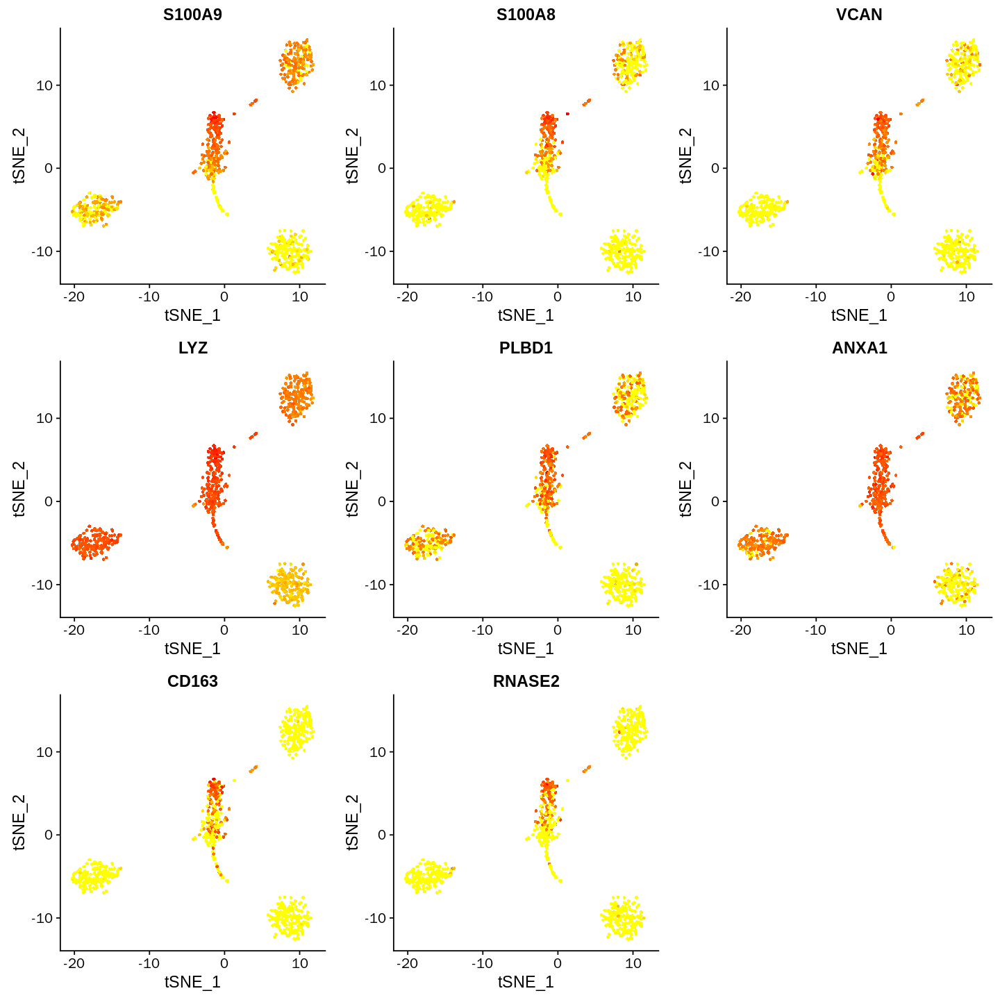

In [53]:
dc3.both = intersect(dc3.calculated.top10$gene,dc3.given.top10$Gene.ID)
options(repr.plot.width=12, repr.plot.height=12,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc3.both,nCol = 3)

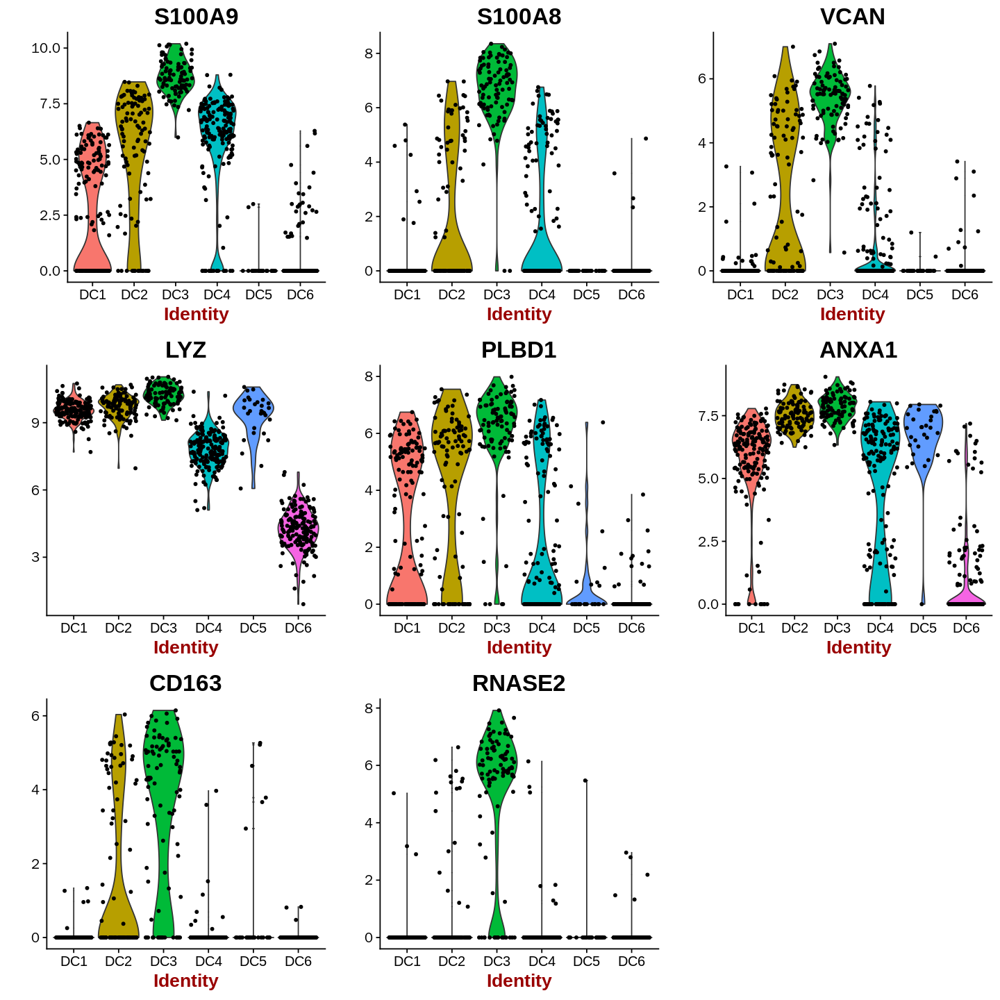

In [54]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc3.both,do.return = T,nCol = 3)

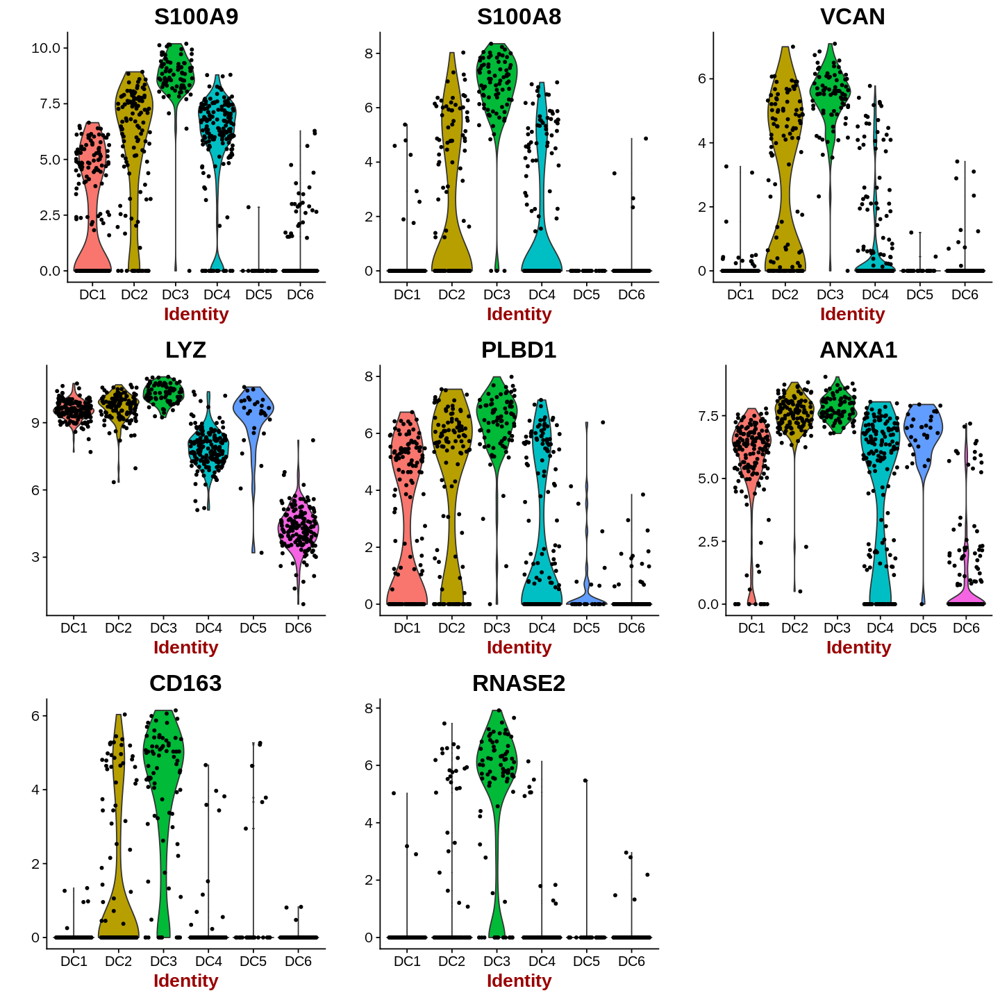

In [55]:
VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc3.both,do.return = T,nCol = 3)

DC3—maker genes given only by original result

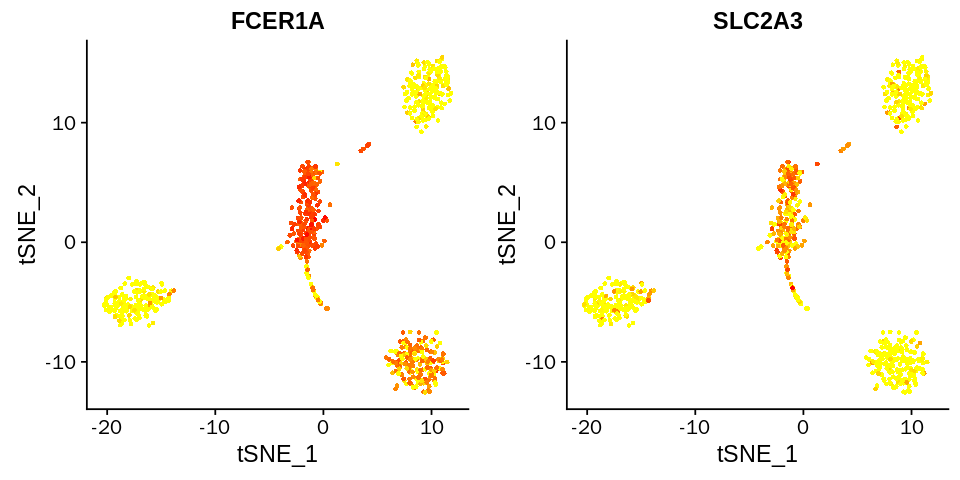

In [56]:
dc3.given.only = setdiff(dc3.given.top10$Gene.ID,dc3.calculated.top10$gene)
options(repr.plot.width=8, repr.plot.height=4,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc3.given.only,nCol = 2)

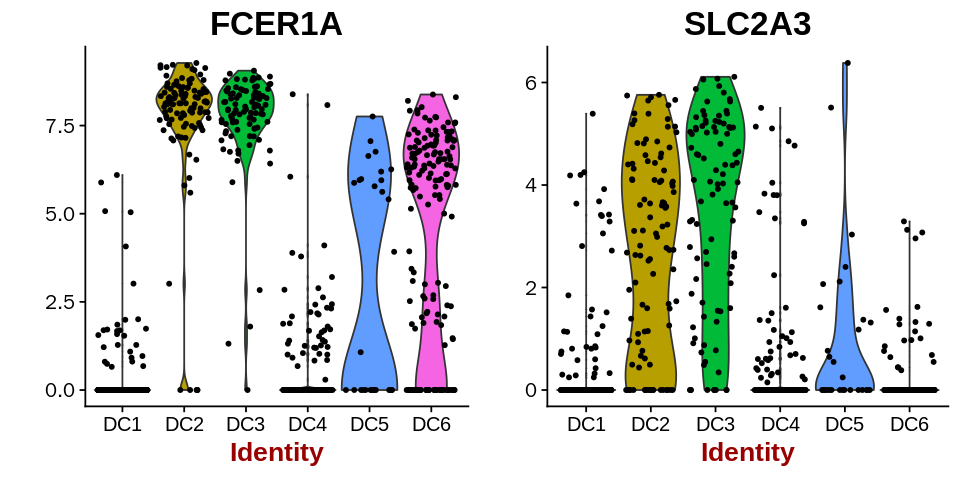

In [57]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc3.given.only,do.return = T,nCol = 2)

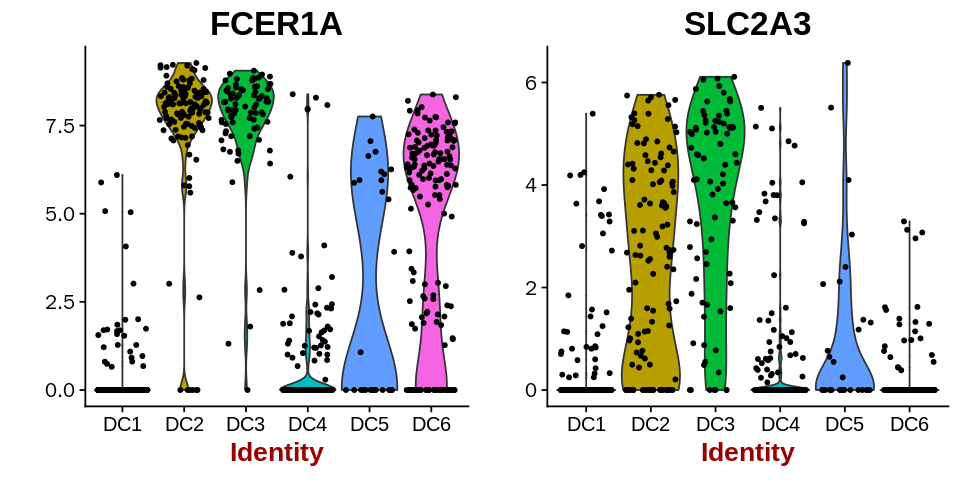

In [58]:
VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc3.given.only,do.return = T,nCol = 2)

DC3—maker genes given only by reproduced result

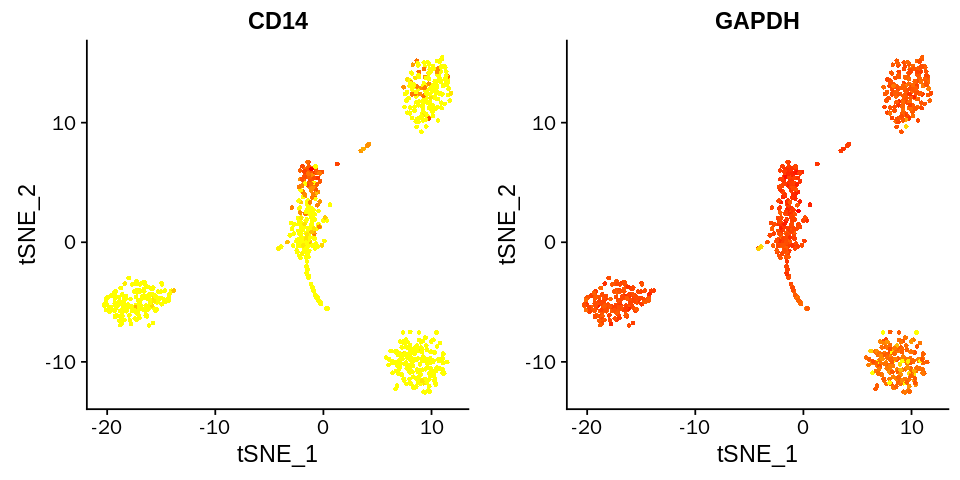

In [59]:
dc3.calculated.only = setdiff(dc3.calculated.top10$gene,dc3.given.top10$Gene.ID)
options(repr.plot.width=8, repr.plot.height=4,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc3.calculated.only,nCol = 2)

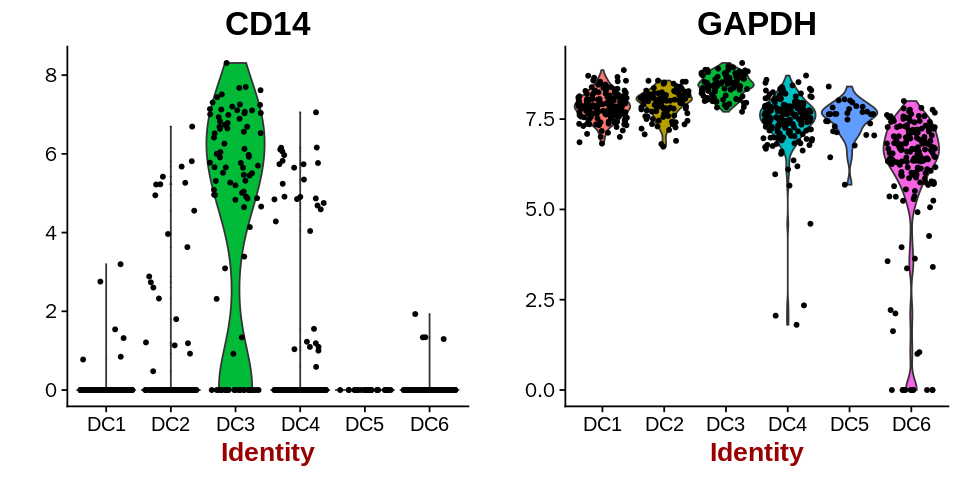

In [60]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc3.calculated.only,do.return = T,nCol = 2)

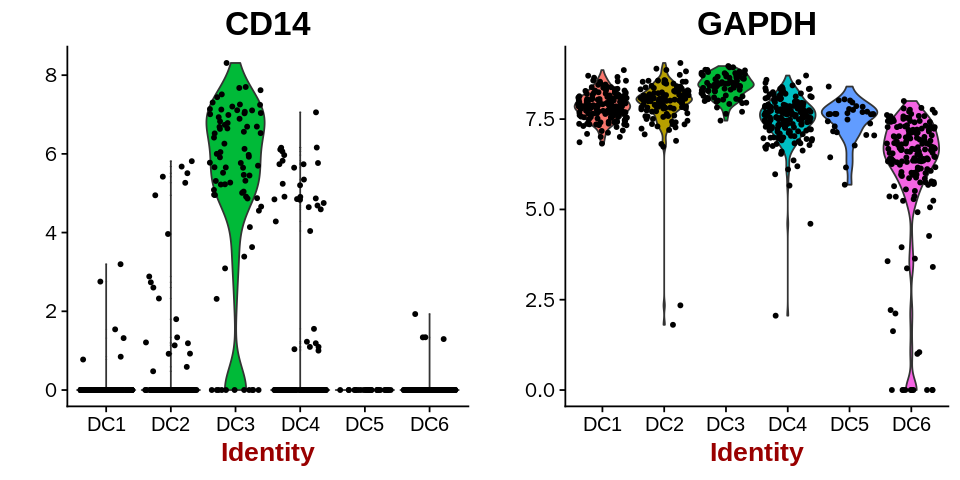

In [61]:
VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc3.calculated.only,do.return = T,nCol = 2)


**DC4 marker genes** 

The original results and the reproduced results given the same top 10 markers for DC4.

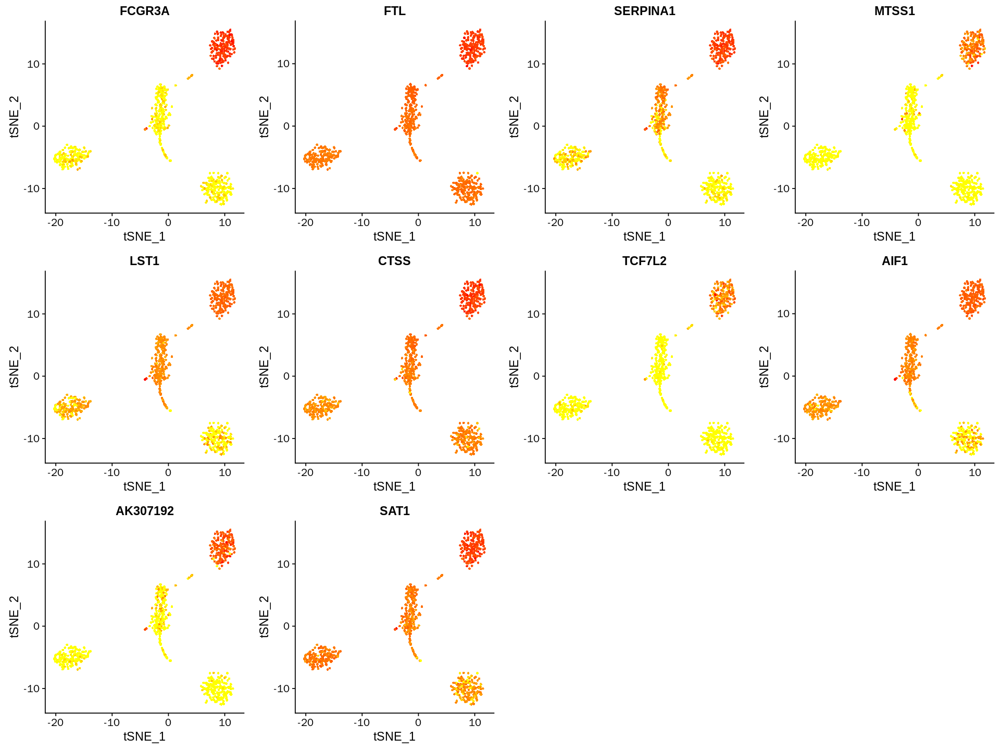

In [62]:
dc4.given.top10 = given.top10[given.top10$Cluster.ID == 'DC4',]
dc4.given.top10 = dc4.given.top10[1:10,]
dc4.calculated.top10 = calculated.top10[calculated.top10$cluster == 'DC4',]
options(repr.plot.width=16, repr.plot.height=12,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc4.calculated.top10$gene,nCol = 4)

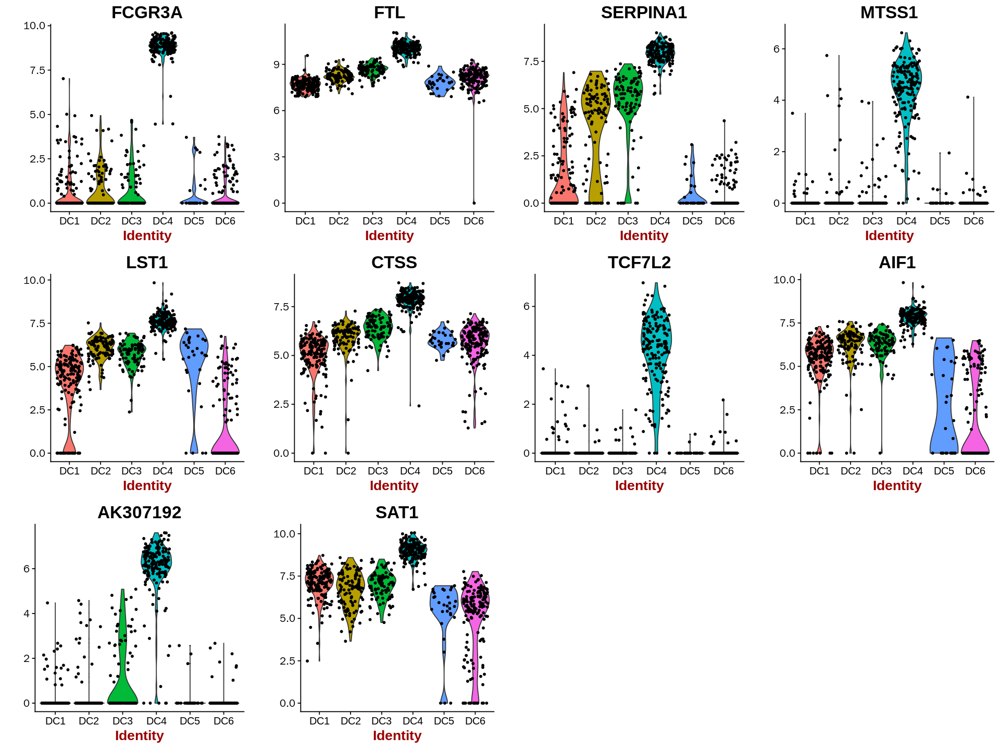

In [63]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc4.calculated.top10$gene,do.return = T,nCol = 4)

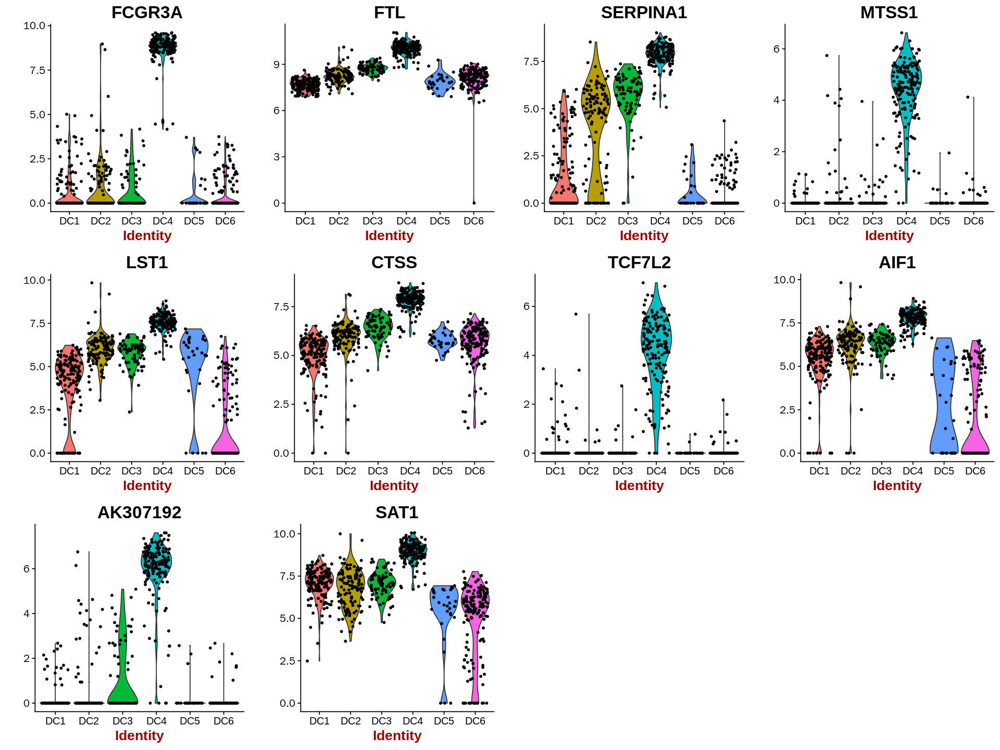

In [64]:
VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc4.calculated.top10$gene,do.return = T,nCol = 4)

**DC5 marker genes** 

The original results and the reproduced results given slightly different top 10 markers for DC5.

(polygon[GRID.polygon.11695], polygon[GRID.polygon.11696], polygon[GRID.polygon.11697], polygon[GRID.polygon.11698], text[GRID.text.11699], text[GRID.text.11700], text[GRID.text.11701], text[GRID.text.11702], text[GRID.text.11703]) 

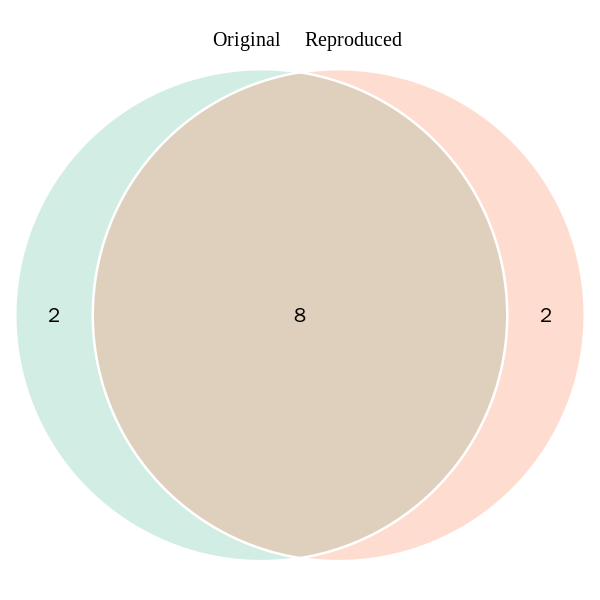

In [65]:
dc5.given.top10 = given.top10[given.top10$Cluster.ID == 'DC5',]
dc5.given.top10 = dc5.given.top10[1:10,]
dc5.calculated.top10 = calculated.top10[calculated.top10$cluster == 'DC5',]
options(repr.plot.width=5, repr.plot.height=5,repr.plot.res = 120)
draw.pairwise.venn(10, 10, length(intersect(dc5.calculated.top10$gene,dc5.given.top10$Gene.ID)), category = c("Original", "Reproduced"),  fill =c("#66C2A5","#FC8D62"), alpha = 0.3, cat.pos = c(-3, 
    3), cat.dist = rep(0.025, 2),col = 'white')

DC5—maker genes given by both original result and reproduce result

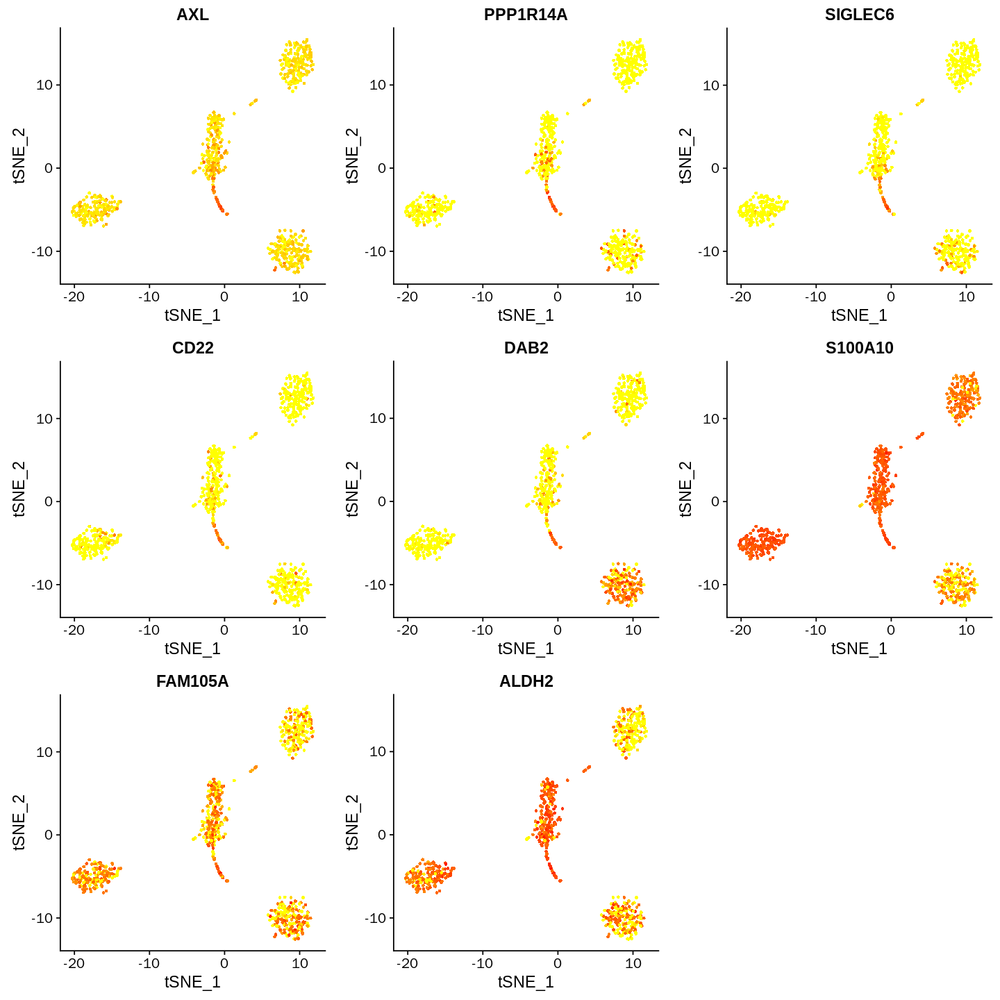

In [66]:
dc5.both = intersect(dc5.calculated.top10$gene,dc5.given.top10$Gene.ID)
options(repr.plot.width=12, repr.plot.height=12,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc5.both,nCol = 3)

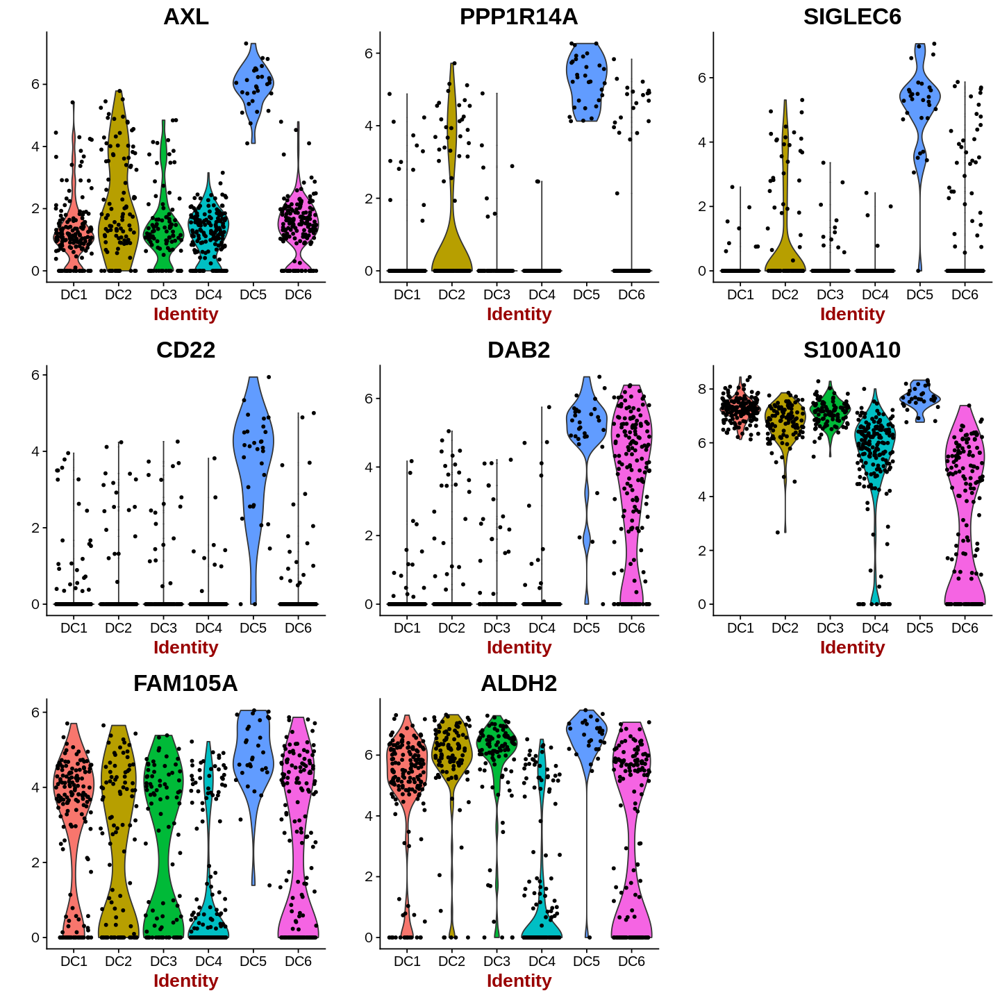

In [67]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc5.both,do.return = T,nCol = 3)

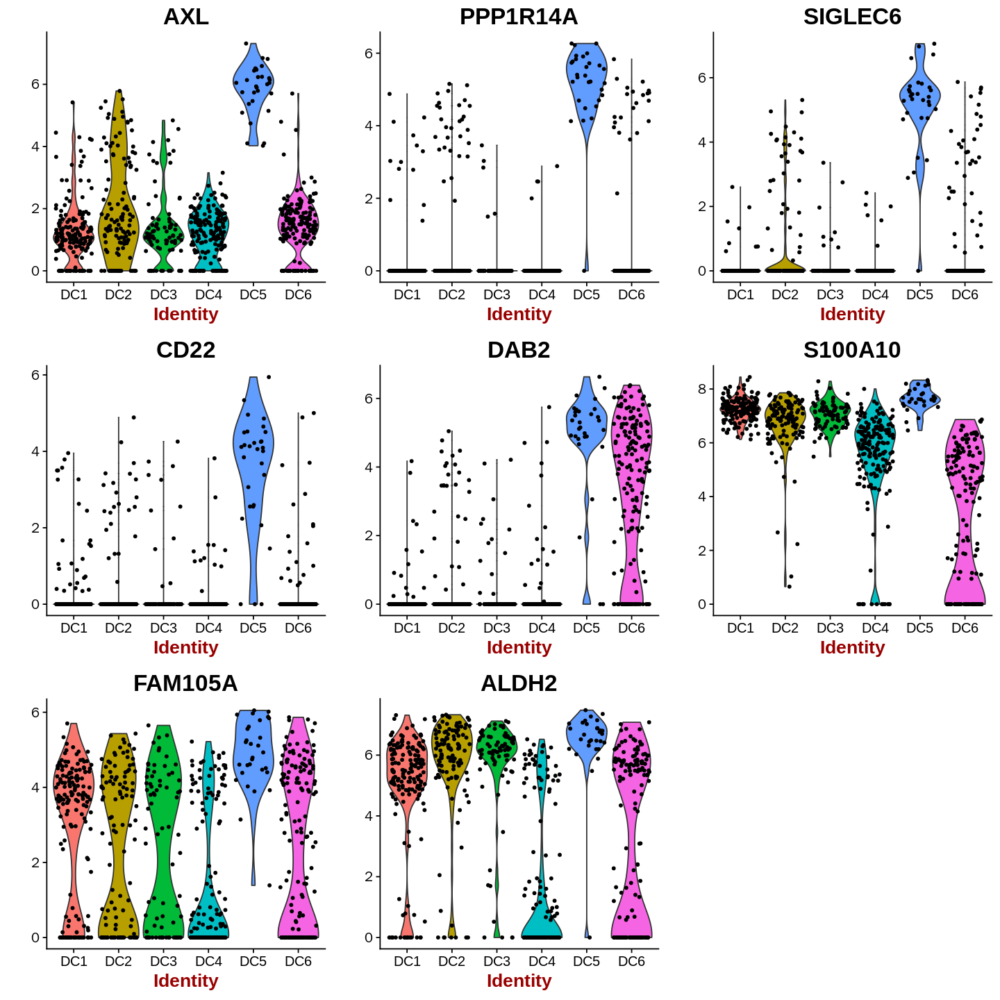

In [68]:
 VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc5.both,do.return = T,nCol = 3)

DC5—maker genes given only by original result

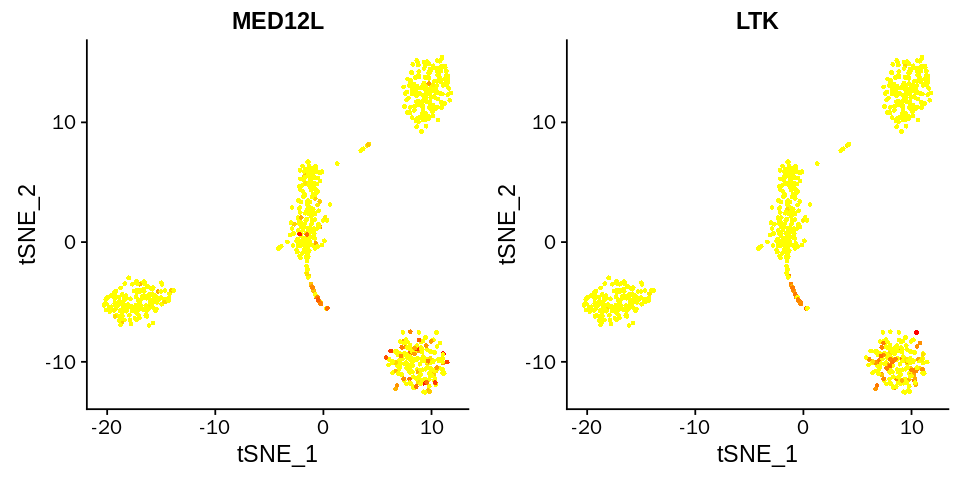

In [69]:
dc5.given.only = setdiff(dc5.given.top10$Gene.ID,dc5.calculated.top10$gene)
options(repr.plot.width=8, repr.plot.height=4,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc5.given.only,nCol = 2)

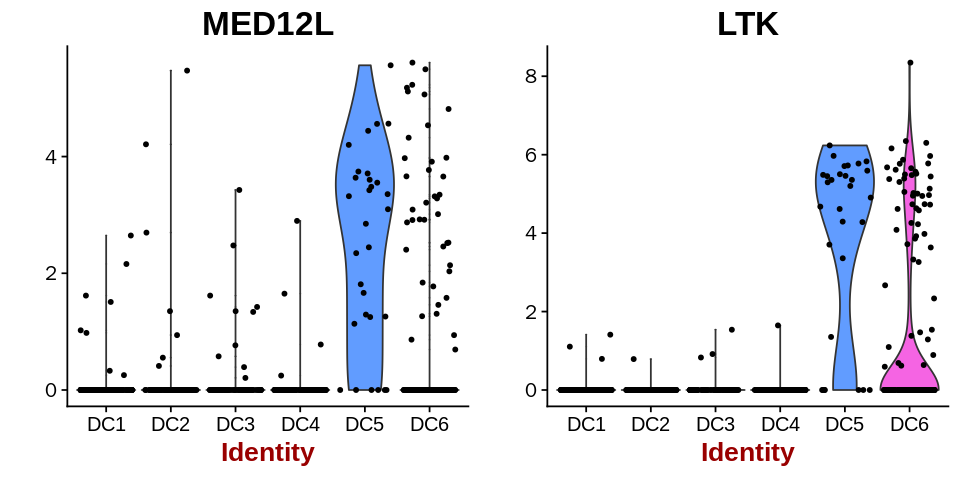

In [70]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc5.given.only,do.return = T,nCol = 2)

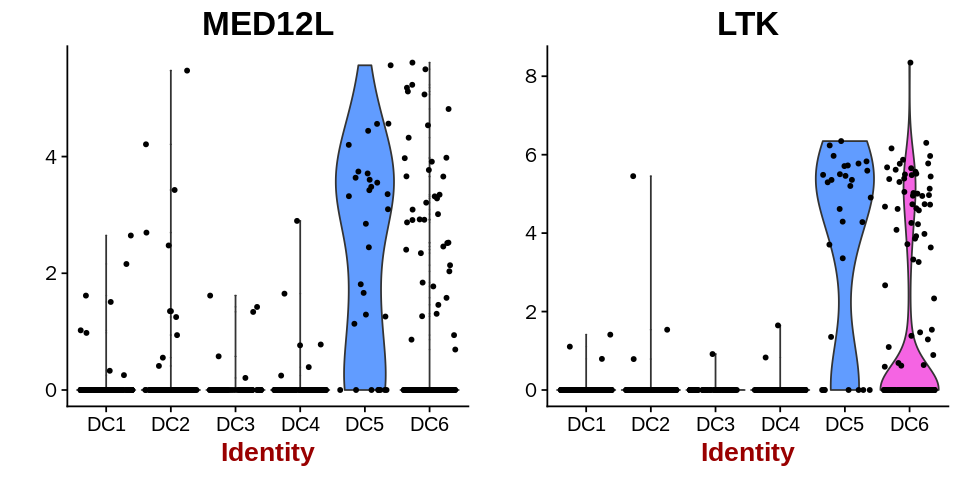

In [71]:
VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc5.given.only,do.return = T,nCol = 2)

DC5—maker genes given only by reproduced result

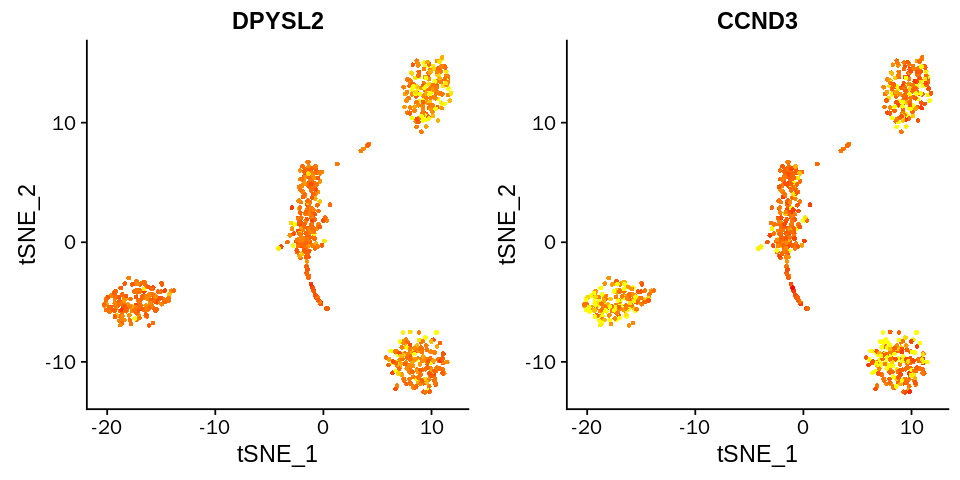

In [72]:
dc5.calculated.only = setdiff(dc5.calculated.top10$gene,dc5.given.top10$Gene.ID)
options(repr.plot.width=8, repr.plot.height=4,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc5.calculated.only,nCol = 2)

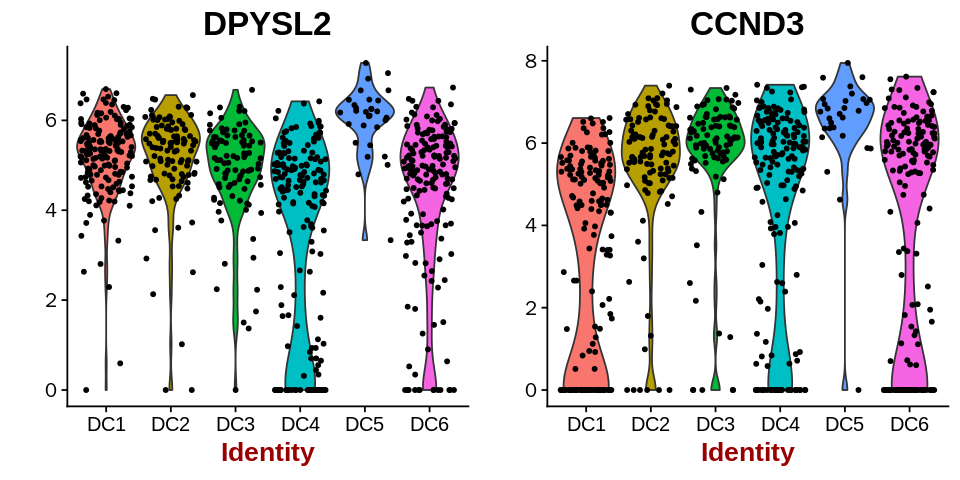

In [73]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc5.calculated.only,do.return = T,nCol = 2)

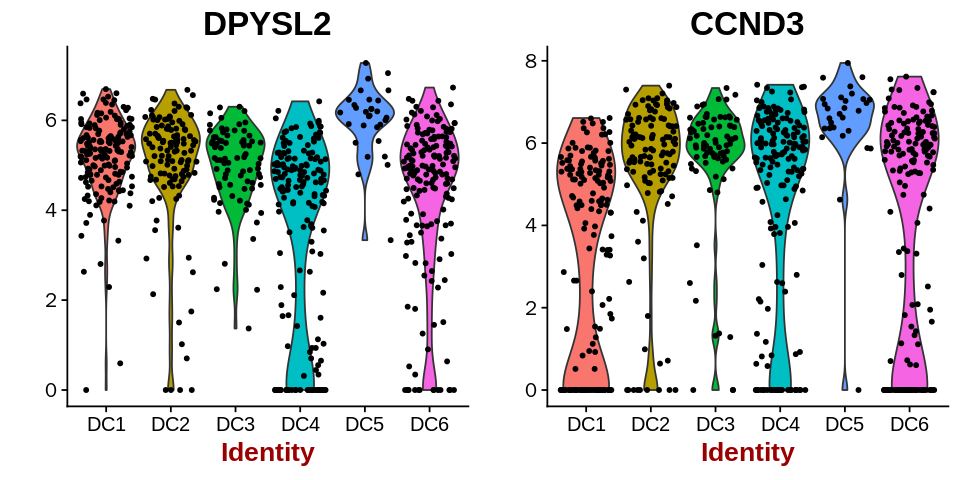

In [74]:
VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc5.calculated.only,do.return = T,nCol = 2)


**DC6 marker genes** 

The original results and the reproduced results given the same top 10 markers for DC6.

[1] 10

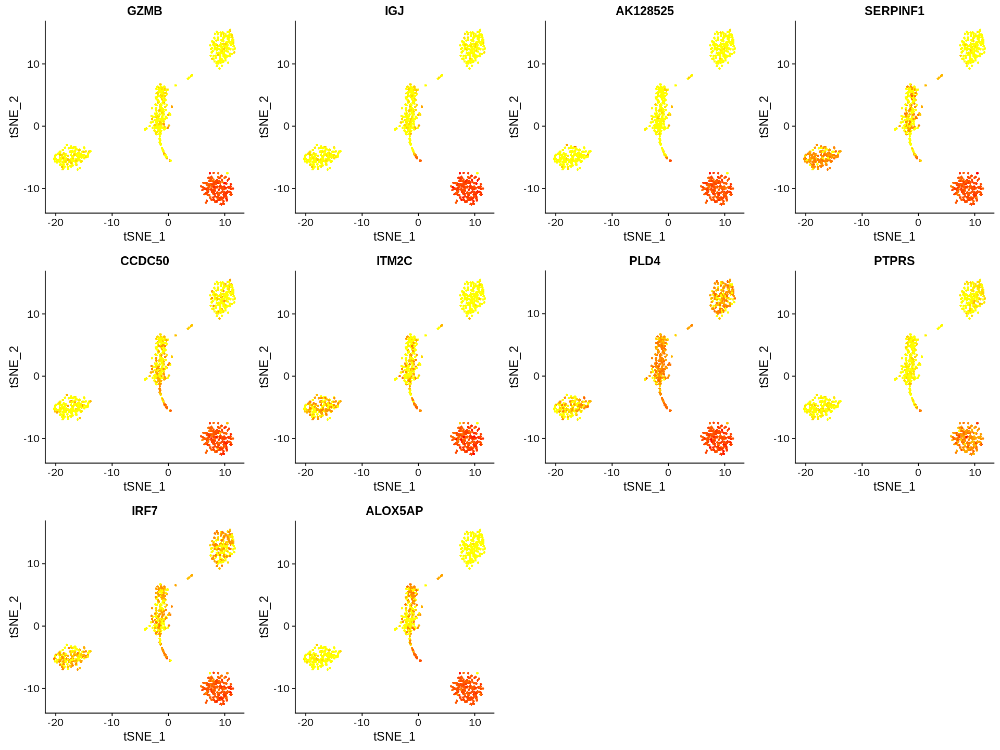

In [75]:
dc6.given.top10 = given.top10[given.top10$Cluster.ID == 'DC6',]
dc6.given.top10 = dc6.given.top10[1:10,]
dc6.calculated.top10 = calculated.top10[calculated.top10$cluster == 'DC6',]
dc6.calculated.top10 = dc6.calculated.top10[1:10,]
length(union(dc6.calculated.top10$gene,dc6.given.top10$Gene.ID))
options(repr.plot.width=16, repr.plot.height=12,repr.plot.res = 120)
FeaturePlot(dcdat,features.plot = dc6.calculated.top10$gene,nCol = 4)

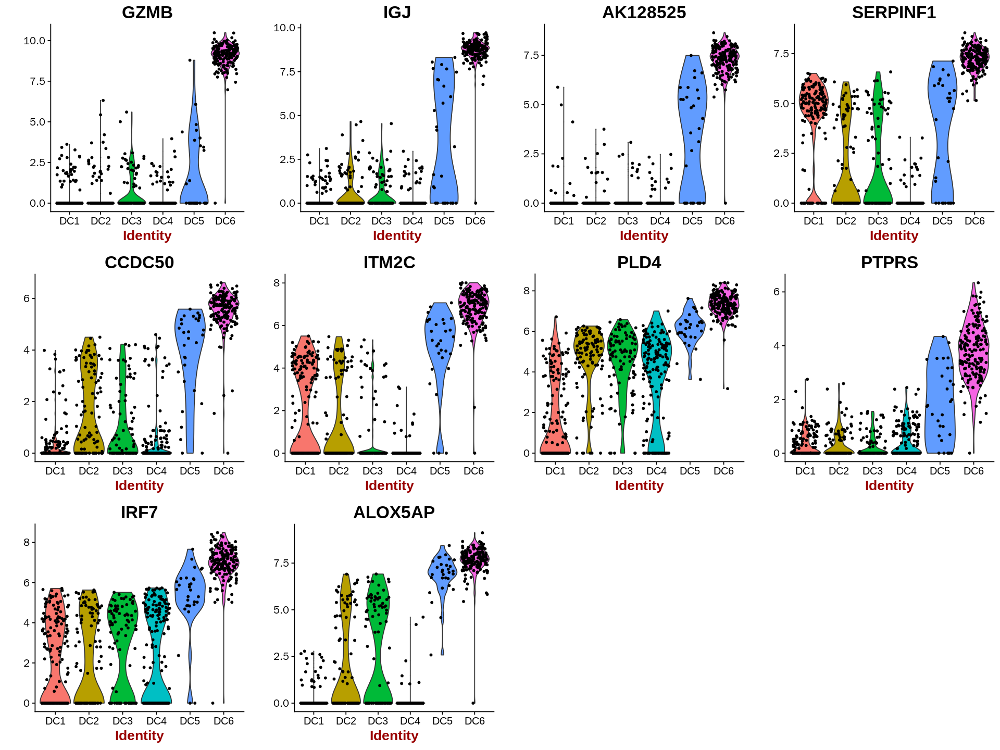

In [76]:
VlnPlot(dcdat,group.by = 'given.label',features.plot = dc6.calculated.top10$gene,do.return = T,nCol = 4)

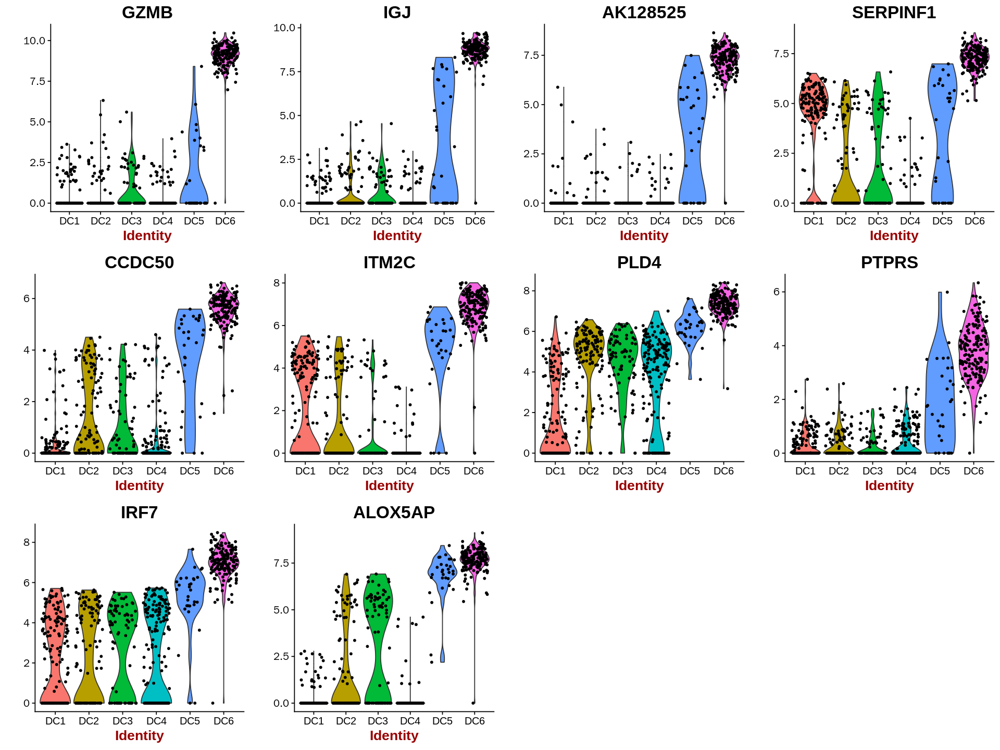

In [77]:
VlnPlot(dcdat,group.by = 'calculated.label',features.plot = dc6.calculated.top10$gene,do.return = T,nCol = 4)

# Further exploration
## The 595 variable genes in the paper
In scRNA-seq data analysis, it is common to first select variable genes as informative features for downstream analyses, and this feature selection step can sometimes affect the final results dramatically. For this work we tried to reproduce, it is described in the original paper that ***595*** variable genes were selected for doing PCA and other downstream analyses. However, the code shows that up to three rounds of PCA with three different selected gene lists were conducted and none of  them contains *595* genes (the closest one is **563** genes in the first round of PCA).  In our reproduction work, we figured it out how the number *595*  came. We found that rerunning `FindVariableGenes()` (or rerun `ScaleData()`and `FindVariableGenes()`) after removing the containminating subpopulations would results in ***595*** variable genes, as shown in the following codes.

NormalizeData has not been run, therefore ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.
ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.


Regressing out: nGene, batch



Time Elapsed:  25.1894335746765 secs

Scaling data matrix


[1] 595

[1] 595

[1] 595

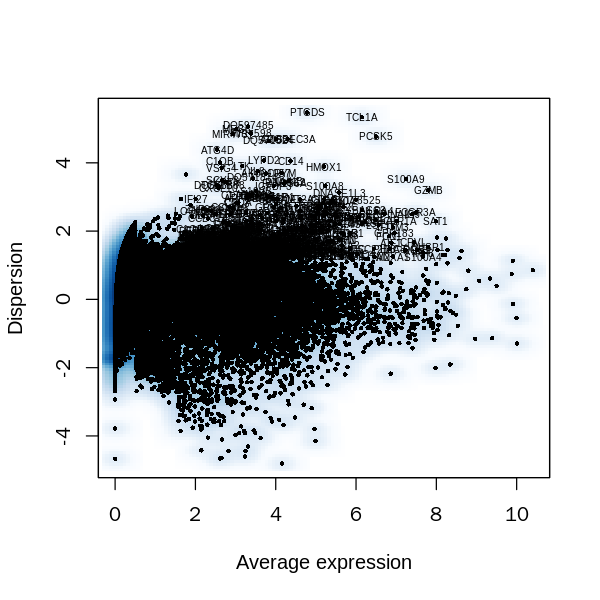

In [78]:
options(repr.plot.width=5, repr.plot.height=5,repr.plot.res = 120)
# method 1,rerun ScaleData() and FindVariableGenes()
dcdat1=ScaleData(dcdat,vars.to.regress  = c("nGene","batch")) 
dcdat1=FindVariableGenes(dcdat1,mean.function = ExpMean,dispersion.function = LogVMR,x.low.cutoff = 2,x.high.cutoff = 8,y.high.cutoff = 30,y.cutoff = 1.25,do.contour = F)
length(dcdat1@var.genes)
#method 2, rerun FindVariableGenes() only
dcdat=FindVariableGenes(dcdat,mean.function = ExpMean,dispersion.function = LogVMR,x.low.cutoff = 2,x.high.cutoff = 8,y.high.cutoff = 30,y.cutoff = 1.25,do.contour = F)

length(dcdat@var.genes)
length(union(dcdat1@var.genes,dcdat@var.genes))
genelist595 = dcdat1@var.genes

## Effects of the selected variable gene list
The key steps of the workflow is to conduct PCA on the selected variable genes and applying clusteirng and tSNE on the achieved PCA space. So far we have ***4*** differents genelists in hand (3 used in each of the three rounds of PCA and the 595 genes we got in the last step). To check the effects of seleted gene list, we conducted the key steps on each of those ***4*** genelists (the result given by gene list 3 is the 'reproduced reuslt' we have discussend before and will be skipped here) and compared all the results with the original results in the paper.

### genelist1

In [80]:
dcdat = RunPCA(dcdat,pc.genes = genelist1,do.print = F)
dcdat = RunTSNE(dcdat,dims.use = 1:5,tsne.method = 'Rtsne',perplexity = 96, max_iter = 1000)
dcdat = FindClusters(dcdat,reduction.type = 'pca',k.param = 30,dims.use = 1:5,algorithm = 3,force.recalc = T,resolution = 1.4,print.output = F)
r = evaluateClusterings (dcdat@ident,dcdat@meta.data[,'given.label'])
current.ids <-as.character(unlist(r$external.eval$aligned.label[,1]))
mapped.ids <- as.character(unlist(r$external.eval$aligned.label[,2]))
dcdat@meta.data[,'calculated.label.genelist1']=factor(mapvalues(x = as.vector(dcdat@ident),from = current.ids,to = mapped.ids),levels = paste('DC',1:6,sep = ''))
p1 <- TSNEPlot(dcdat,do.label = F,colors.use = mcols,group.by = 'given.label',do.return = T)
p2 <- TSNEPlot(dcdat,colors.use = mcols,group.by = 'calculated.label.genelist1',do.return = T)

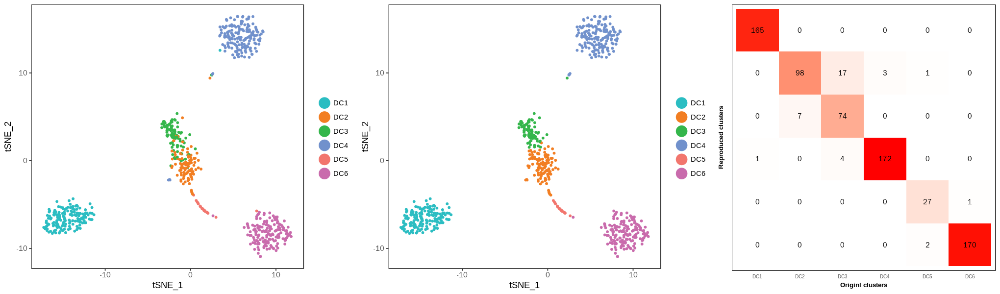

In [81]:
options(repr.plot.width=17, repr.plot.height=5,repr.plot.res = 120)
ggarrange(p1,p2,r$external.eval$m.plot,widths = c(1,1,0.8),ncol = 3)

### genelist2

In [82]:
# gene list2
dcdat = RunPCA(dcdat,pc.genes = genelist2,do.print = F)
dcdat = RunTSNE(dcdat,dims.use = 1:5,tsne.method = 'Rtsne',perplexity = 96, max_iter = 1000)
dcdat = FindClusters(dcdat,reduction.type = 'pca',k.param = 30,dims.use = 1:5,algorithm = 3,force.recalc = T,resolution = 1.4,print.output = F)

r = evaluateClusterings (dcdat@ident,dcdat@meta.data[,'given.label'])
current.ids <-as.character(unlist(r$external.eval$aligned.label[,1]))
mapped.ids <- as.character(unlist(r$external.eval$aligned.label[,2]))
dcdat@meta.data[,'calculated.label.genelist2']=factor(mapvalues(x = as.vector(dcdat@ident),from = current.ids,to = mapped.ids),levels = paste('DC',1:6,sep = ''))
p1 <- TSNEPlot(dcdat,do.label = F,colors.use = mcols,group.by = 'given.label',do.return = T)
p2 <- TSNEPlot(dcdat,colors.use = mcols,group.by = 'calculated.label.genelist2',do.return = T)

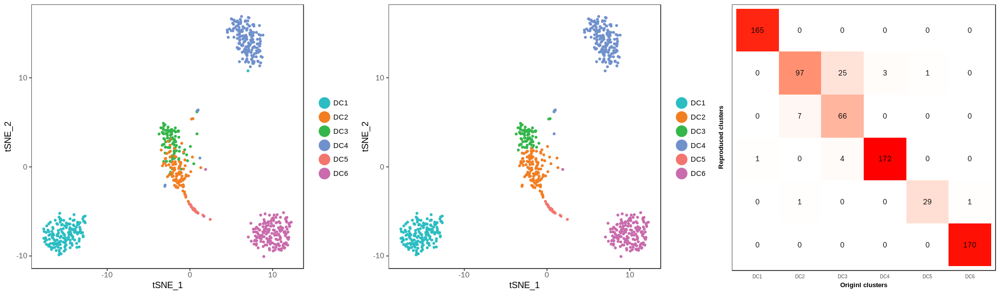

In [83]:
options(repr.plot.width=17, repr.plot.height=5,repr.plot.res = 120)
ggarrange(p1,p2,r$external.eval$m.plot,widths = c(1,1,0.8),ncol = 3)

### gene list 595

In [84]:
dcdat = RunPCA(dcdat,pc.genes = genelist595,do.print = F)
dcdat = RunTSNE(dcdat,dims.use = 1:5,tsne.method = 'Rtsne',perplexity = 96, max_iter = 1000)
dcdat = FindClusters(dcdat,reduction.type = 'pca',k.param = 30,dims.use = 1:5,algorithm = 3,force.recalc = T,resolution = 1.4,print.output = F)

r = evaluateClusterings (dcdat@ident,dcdat@meta.data[,'given.label'])
current.ids <-as.character(unlist(r$external.eval$aligned.label[,1]))
mapped.ids <- as.character(unlist(r$external.eval$aligned.label[,2]))
dcdat@meta.data[,'calculated.label.genelist595']=factor(mapvalues(x = as.vector(dcdat@ident),from = current.ids,to = mapped.ids),levels = paste('DC',1:6,sep = ''))
p1 <- TSNEPlot(dcdat,do.label = F,colors.use = mcols,group.by = 'given.label',do.return = T)
p2 <- TSNEPlot(dcdat,colors.use = mcols,group.by = 'calculated.label.genelist595',do.return = T)
#ggarrange(p1,p2,widths = c(1,1),ncol = 2,align = 'v')

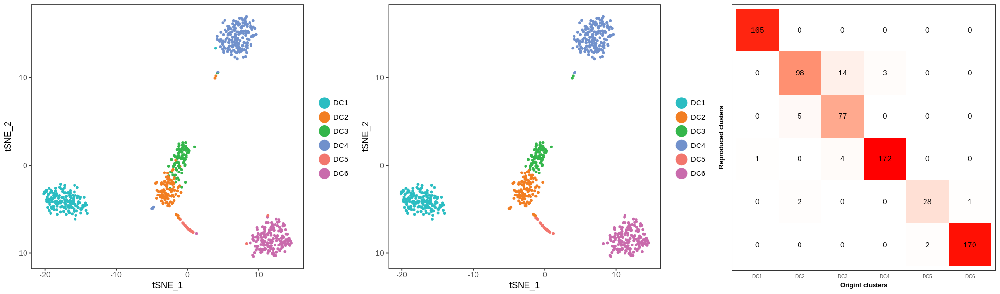

In [85]:
options(repr.plot.width=17, repr.plot.height=5,repr.plot.res = 120)
ggarrange(p1,p2,r$external.eval$m.plot,widths = c(1,1,0.8),ncol = 3)

### Blurry boudary of DC2 and DC3

Here is the heatmap of some selected marker genes(Fig. 2A in the original paper). The boundary between DC2 and DC3 are not that clear. This blurry boundary is where the disagreement between different classification lies. 

In [87]:
require(pheatmap)
markers = c('BST1','CD163','F13A1','S100A9','S100A8','VCAN','RNASE2','FCN1','CD14',
            'TMEM176B','PLBD1','MGST1','RAB3D','CD36','CD1C','DQ-A1','HLA-DQA2',
            'HLA-DQA1','HLA-DQB1','HLA-DPB1','HLA-DQB','FCGR2B')
markers1 = unique(intersect(intersect(intersect(genelist1,genelist2),genelist3),genelist595))

DC2.DC3.cells = row.names(dcdat@meta.data[dcdat@meta.data$given.label %in% c("DC2",'DC3'),])


DC23.data = dcdat@scale.data[markers,DC2.DC3.cells]
DC23.data1 = dcdat@scale.data[markers1,DC2.DC3.cells]

q = quantile(DC23.data,c(0.2,0.8))
DC23.data[DC23.data<q[1]] = q[1]
DC23.data[DC23.data>q[2]] = q[2]

q = quantile(DC23.data1,c(0.2,0.8))
DC23.data1[DC23.data1<q[1]] = q[1]
DC23.data1[DC23.data1>q[2]] = q[2]


calculated.label = dcdat@meta.data[dcdat@meta.data$given.label %in% c("DC2",'DC3'),'calculated.label']
given.label = dcdat@meta.data[dcdat@meta.data$given.label %in% c("DC2",'DC3'),'given.label']
genelist1.label = dcdat@meta.data[dcdat@meta.data$given.label %in% c("DC2",'DC3'),'calculated.label.genelist1']
genelist2.label = dcdat@meta.data[dcdat@meta.data$given.label %in% c("DC2",'DC3'),'calculated.label.genelist2']
genelist595.label = dcdat@meta.data[dcdat@meta.data$given.label %in% c("DC2",'DC3'),'calculated.label.genelist595']


col = colorRampPalette(c('#FF00FF','#000000','#FFFF00'))(500)

index = order(given.label,calculated.label,genelist1.label,genelist2.label,genelist595.label)


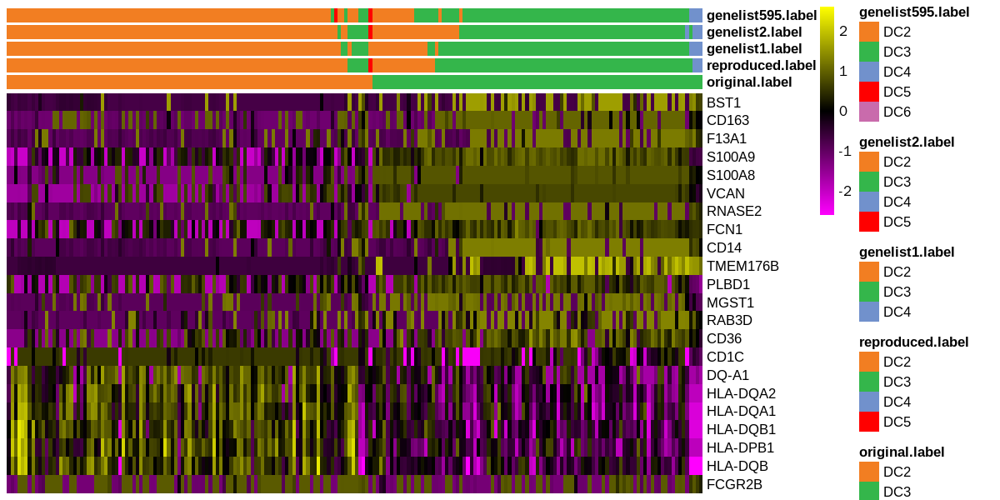

In [88]:
options(repr.plot.width=10, repr.plot.height=5,repr.plot.res = 120)
pheatmap(DC23.data[,index],cluster_rows = F,cluster_cols = F,scale = 'row',show_colnames = F,color = col,
         annotation_col = data.frame(
                                    original.label = given.label[index],
                                    reproduced.label = calculated.label[index],
                                    genelist1.label = genelist1.label[index],
                                    genelist2.label = genelist2.label[index],
                                    genelist595.label = genelist595.label[index],
                                    row.names = colnames(DC23.data[,index])
                                  ),
         annotation_colors = list(
           original.label = c(DC2 = '#F27E22',DC3 = '#34B64B'),
           reproduced.label = c(DC2 = '#F27E22',DC3 = '#34B64B',DC4 = '#7191CC', DC5 = 'red'),
           genelist1.label = c(DC2 = '#F27E22', DC3 = '#34B64B', DC4 = '#7191CC'),
           genelist2.label = c(DC2 = '#F27E22', DC3 = '#34B64B', DC4 = '#7191CC', DC5 = 'red'),
           genelist595.label = c(DC2 = '#F27E22', DC3 = '#34B64B', DC4 = '#7191CC', DC5 = 'red',DC6 = '#C96BAC')
         ), 
         width = 10,height = 5)

### Expression patterns of some marker genes
Here are the expression patterns of some marker genes used in the original work to sort DC2 and DC3 in the validation experiment.

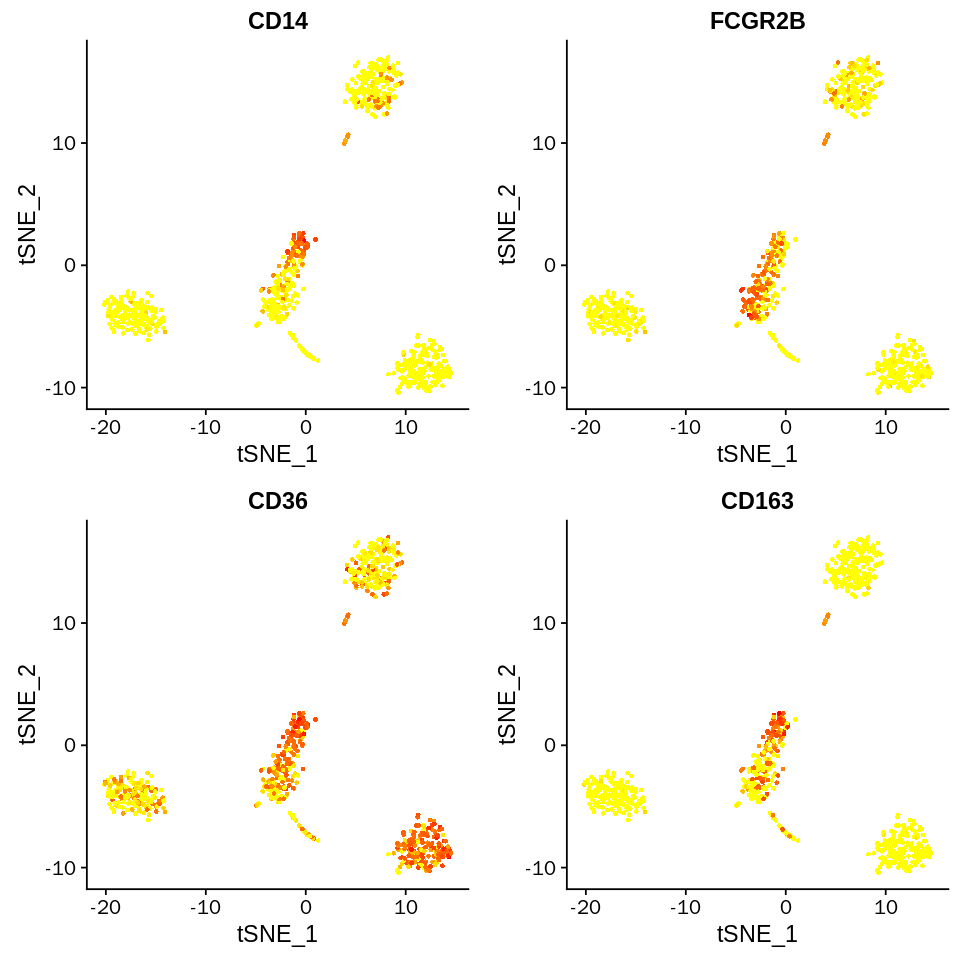

In [161]:
options(repr.plot.width=8, repr.plot.height=8,repr.plot.res = 120)
selected.markers = c('CD14','FCGR2B','CD36','CD163')
FeaturePlot(dcdat,features.plot = selected.markers,reduction.use = 'tsne')

## Reproduce of some other figures in the original paper

The details for generating most of the figures in the original paper is not provided. Here we try to reproduce some of them that related cell atals.

### Reproduce Figure 3B 

The raw data matrix (TPM provided by the paper) of the ***742*** dendritic cells and the ***335*** monocytes (all these cells has a label available in the supplementary) were used in the analysis. The z-score normalization method was used on the log-transformed data (log(data+1)). Then we selected variable genes using the group-wise z-score method implemented in Seurat with the default parameters. This resulted in ***2629*** variable genes. The top ***2000*** variable genes were used for PCA. The first ***25*** PCs (decided based on the Elbow plot) were used for t-SNE with perplexity equals to ***60*** (this parameter was arbitrarily set after a few attempts). All monocytes were colored based on the label given in the paper. The DCs were colored according the original paper and the reproduced label, separately.

In [107]:
# Extract DC and monocytes
dcmono1 = SubsetData(dcmono,cells.use = dcmono@cell.names[dcmono@meta.data$given.label != 'outlier'])

In [108]:
dcmono1@meta.data$mixed.label =  dcmono1@meta.data$given.label
dcmono1@meta.data$mixed.label[1:742] = as.character(dcdat@meta.data$calculated.label)
unique(dcmono1@meta.data$mixed.label)

[1] "DC1"   "DC5"   "DC2"   "DC3"   "DC4"   "DC6"   "Mono1" "Mono2" "Mono3"
[10] "Mono4"

In [109]:
# Add batch information
dcmono1@meta.data$batch = 'Mono'
dcmono1@meta.data$batch[1:742] = as.character(dcdat@meta.data$batch)
#dcmono1=ScaleData(do.par = ,vars.to.regress  = c("nGene","batch")) 
dcmono1=ScaleData(dcmono1,do.par = T) 

NormalizeData has not been run, therefore ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.
ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.


Scaling data matrix


In [110]:
dcmono1 = FindVariableGenes(dcmono1,do.plot = F)
length(dcmono1@var.genes)

[1] 2629

In [111]:
dcmono1 = RunPCA(dcmono1,pcs.compute = 100, pc.genes =head(dcmono1@var.genes,2000),do.print = F)

Warning message in irlba(A = t(x = data.use), nv = pcs.compute, ...):
“did not converge--results might be invlaid!; try increasing work or maxit”

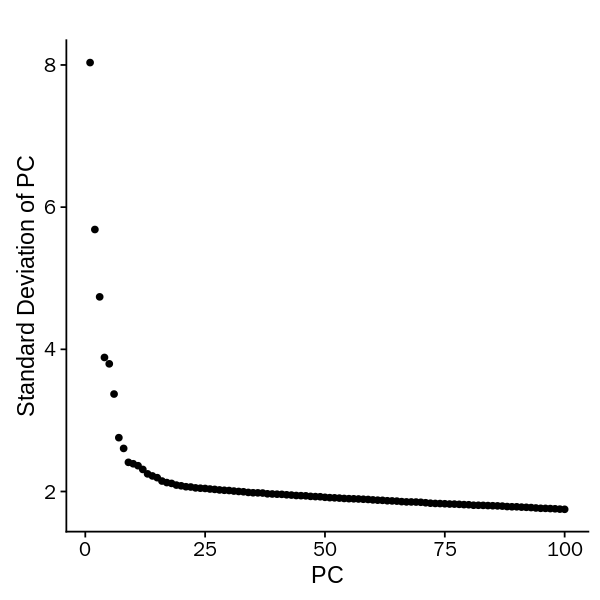

In [112]:
options(repr.plot.width=5, repr.plot.height=5,repr.plot.res = 120)
PCElbowPlot(dcmono1,num.pc = 100)

In [116]:
dcmono1 = RunTSNE(dcmono1,perplexity = 60,tsne.method = 'Rtsne',dims.use = 1:25)

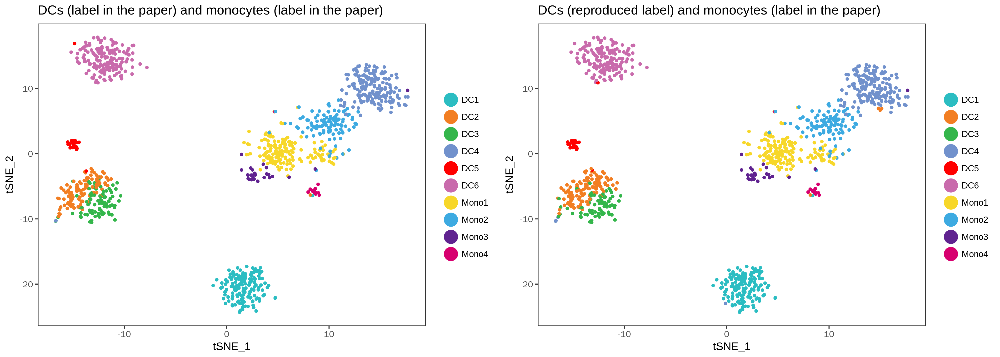

In [138]:
options(repr.plot.width=14, repr.plot.height=5,repr.plot.res = 300)
p1 <- TSNEPlot(dcmono1, group.by = 'given.label',colors.use = mcols1,do.return = T)
p1 <- p1 + ggtitle('DCs (label in the paper) and monocytes (label in the paper)') + theme(title = element_text(hjust = 0.5))
p2 <- TSNEPlot(dcmono1,group.by = 'mixed.label',colors.use = mcols1,do.return = T)
p2 <- p2 + ggtitle('DCs (reproduced label) and monocytes (label in the paper)') + theme(title = element_text(hjust = 0.5))
plot_grid(p1,p2)

### Reproduce Figure 3C

In [118]:
dcmono1 = SetAllIdent(dcmono1,id = 'mixed.label')
levels(dcmono1@ident)

[1] "DC1"   "DC2"   "DC3"   "DC4"   "DC5"   "DC6"   "Mono1" "Mono2" "Mono3"
[10] "Mono4"

In [119]:
mono.markers = FindAllMarkers(dcmono1,test.use = 'roc')

In [120]:
head(mono.markers)

,myAUC,avg_diff,power,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
TYROBP,0.007,-3.447099,0.986,-3.447099,0.461,0.996,NA,DC1,TYROBP
CLEC9A,0.985,4.935461,0.970,4.935461,0.976,0.039,NA,DC1,CLEC9A
C1ORF54,0.984,4.341207,0.968,4.341207,0.976,0.064,NA,DC1,C1ORF54
HLA-DPA1,0.983,1.411841,0.966,1.411841,1.000,0.971,NA,DC1,HLA-DPA1
ZEB2,0.028,-4.732064,0.944,-4.732064,0.170,0.957,NA,DC1,ZEB2
CADM1,0.971,4.672253,0.942,4.672253,0.952,0.037,NA,DC1,CADM1


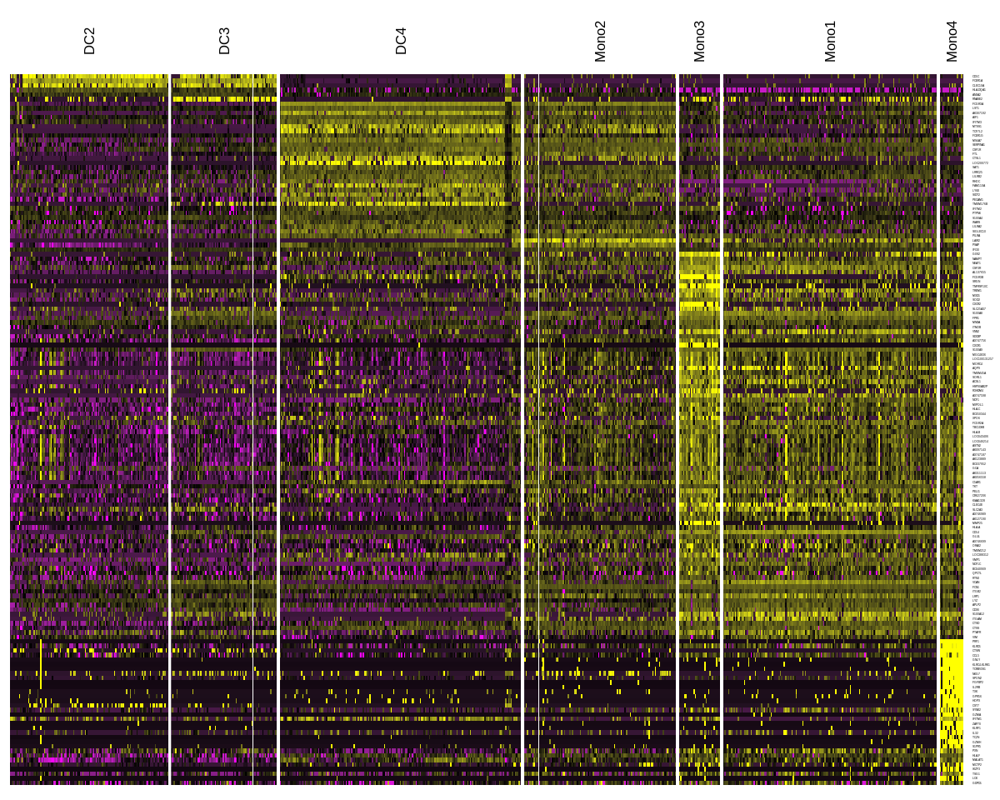

In [121]:
mono.sig.gene.fig6G = rbind(
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='DC2',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='DC3',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='DC4',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='Mono2',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='Mono3',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='Mono1',],
    mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='Mono4',]
)
mono.gene.use = mono.sig.gene.fig6G$gene
options(repr.plot.width=10, repr.plot.height=8,repr.plot.res = 120)
DoHeatmap(dcmono1,genes.use = mono.gene.use,slim.col.label = TRUE, remove.key = T,group.label.rot = 30,
          cells.use = dcmono1@cell.names[dcmono1@ident %in% c('DC2','DC3','DC4','Mono2','Mono3','Mono1','Mono4')] ,
          group.label.loc = 'top',group.cex = 10,cex.row = 2,
          group.order = c('DC2','DC3','DC4','Mono2','Mono3','Mono1','Mono4'))

### Reproduce Figure S4B

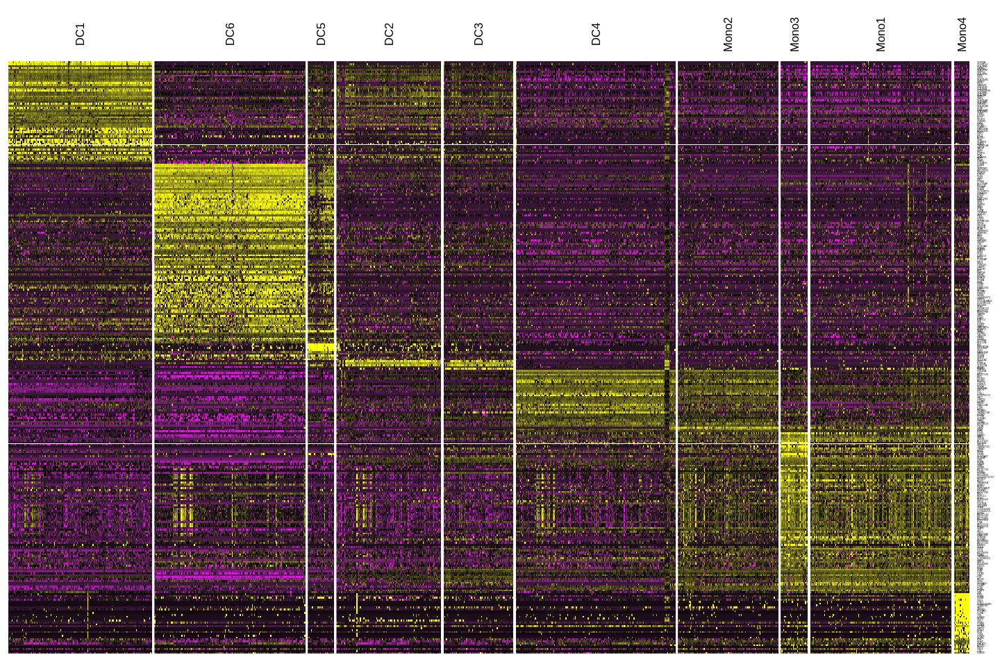

In [122]:
mono.sig.gene.figS3B = rbind(
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='DC1',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='DC6',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='DC5',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='DC2',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='DC3',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='DC4',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='Mono2',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='Mono3',],
  mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='Mono1',],
    mono.markers[mono.markers$myAUC>=0.85 & mono.markers$cluster=='Mono4',]
)
mono.gene.use = mono.sig.gene.figS3B$gene
options(repr.plot.width=12, repr.plot.height=8,repr.plot.res = 120)
DoHeatmap(dcmono1,genes.use = mono.gene.use,slim.col.label = TRUE, remove.key = T,group.label.rot = 30,
          group.label.loc = 'top',group.cex = 10,cex.row = 2,
          group.order = c('DC1','DC6','DC5','DC2','DC3','DC4','Mono2','Mono3','Mono1','Mono4'))

### Reproduce Fig 4C

In [127]:
length(grep(colnames(data2),pattern = 'AXLSIGLEC6_S',fixed = 6))

[1] 119

In [128]:
AS_DC = data2[,grep(colnames(data2),pattern = 'AXLSIGLEC6_S',fixed = 6)]

In [129]:
dcdat1 = AddSamples(dcdat,new.data = log(AS_DC+1),add.cell.id = 'Enriched_AS')

Warning message in `[<-.factor`(`*tmp*`, iseq, value = c("Enriched_AS", "Enriched_AS", :
“invalid factor level, NA generated”Warning message in `[<-.factor`(`*tmp*`, iseq, value = c("Enriched_AS", "Enriched_AS", :
“invalid factor level, NA generated”Warning message in `[<-.factor`(`*tmp*`, iseq, value = c("Enriched_AS", "Enriched_AS", :
“invalid factor level, NA generated”Warning message in `[<-.factor`(`*tmp*`, iseq, value = c("Enriched_AS", "Enriched_AS", :
“invalid factor level, NA generated”

In [130]:
#add meta data
dcdat1@meta.data$type = rep(c('orig','add'),c(742,119))
dcdat1@meta.data$new.calculated.label = 'Enriched.AS.DCs'
dcdat1@meta.data$new.calculated.label[1:742] = as.character(dcdat1@meta.data$calculated.label[1:742])

In [131]:
# removing batch effect
dcdat1 = ScaleData(dcdat1,vars.to.regress = c('type'),do.par = T)

Regressing out: type



Time Elapsed:  16.2183408737183 secs

Scaling data matrix


[1] 1123

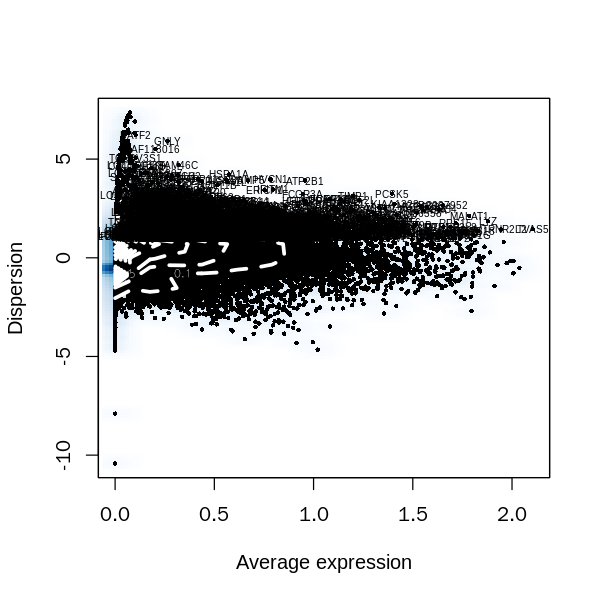

In [132]:
options(repr.plot.width=5, repr.plot.height=5,repr.plot.res = 120)
dcdat1 = FindVariableGenes(dcdat1,x.low.cutoff = 0.1)
length(dcdat1@var.genes)

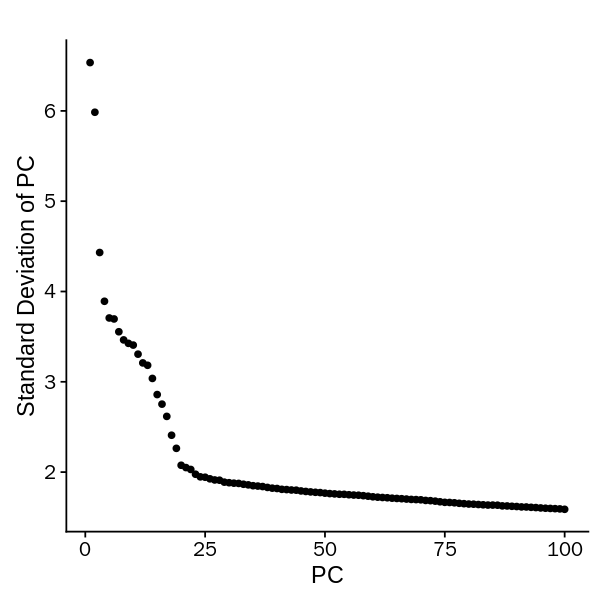

In [133]:
options(repr.plot.width=5, repr.plot.height=5,repr.plot.res = 120)
dcdat1 = RunPCA(dcdat1,pcs.compute = 100,do.print = F)
PCElbowPlot(dcdat1,num.pc = 100)

In [139]:
dcdat1 = RunTSNE(dcdat1,dims.use = 1:25,perplexity = 96)

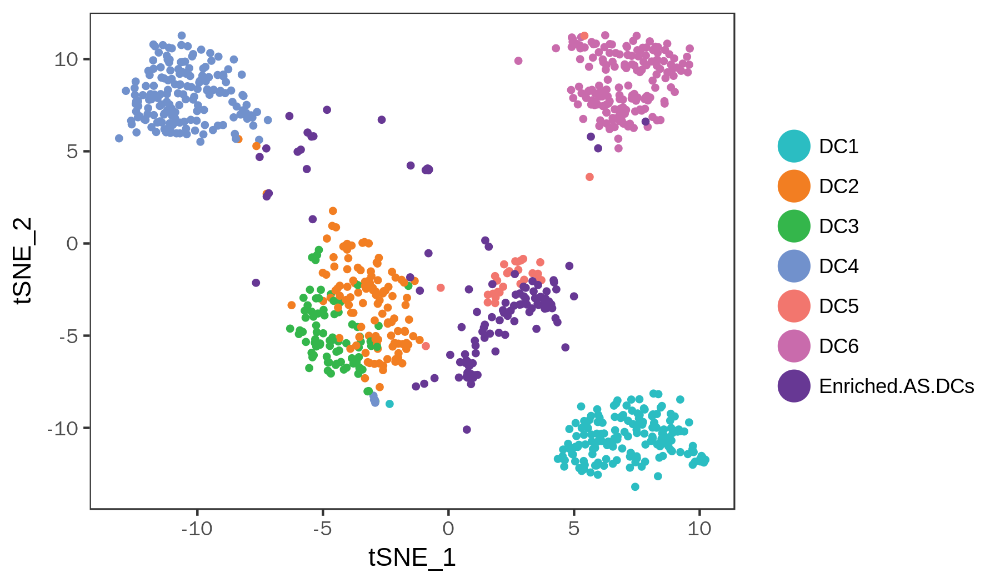

In [144]:
options(repr.plot.width=6, repr.plot.height=3.5,repr.plot.res = 300)
TSNEPlot(dcdat1,group.by = 'new.calculated.label',colors.use = c(mcols[1:6],'#673894'))

## Figure 6G

### Reproduction without removing batch effect

In [162]:
dcdat2 = AddSamples(dcdat,new.data = log(BPDCN+1),add.cell.id = 'BPDCN')

Warning message in `[<-.factor`(`*tmp*`, iseq, value = c("BPDCN", "BPDCN", "BPDCN", :
“invalid factor level, NA generated”Warning message in `[<-.factor`(`*tmp*`, iseq, value = c("BPDCN", "BPDCN", "BPDCN", :
“invalid factor level, NA generated”Warning message in `[<-.factor`(`*tmp*`, iseq, value = c("BPDCN", "BPDCN", "BPDCN", :
“invalid factor level, NA generated”Warning message in `[<-.factor`(`*tmp*`, iseq, value = c("BPDCN", "BPDCN", "BPDCN", :
“invalid factor level, NA generated”

In [163]:
dcdat2@meta.data$new.label = c(as.character(dcdat@meta.data$calculated.label),rep(c('BPDCN_1','BPDCN_2','BPDCN_3','BPDCN_4'),N))
dcdat2@meta.data$new.label = factor(dcdat2@meta.data$new.label,levels = c('DC1','DC2','DC3','DC4','DC5','DC6','BPDCN_1','BPDCN_2','BPDCN_3','BPDCN_4'))
dcdat2@meta.data$type1 = c(rep('DCs',742),rep(c('BPDCN_1','BPDCN_2','BPDCN_3','BPDCN_4'),N))
dcdat2@meta.data$type2 = rep(c('DCs','BPDCN'),c(742,sum(N)))

In [164]:
#dcdat2 = ScaleData(dcdat2,vars.to.regress = c('type2','nGene'),do.par = T)
dcdat2 = ScaleData(dcdat2,do.par = T)

Scaling data matrix


In [165]:
dcdat2 = FindVariableGenes(dcdat2,x.low.cutoff = 0.1,do.plot = F)
length(dcdat2@var.genes)

[1] 1226

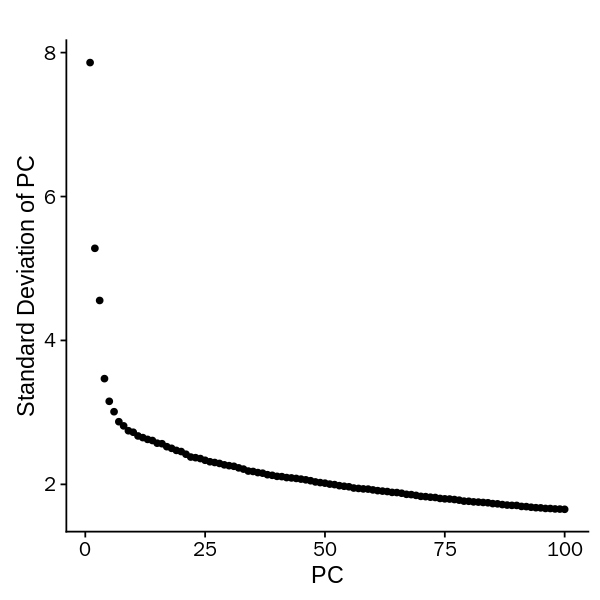

In [168]:
dcdat2 = RunPCA(dcdat2,pcs.compute = 100,do.print = F)
#dcdat2 = RunPCA(dcdat2,pcs.compute = 100,do.print = F,pc.genes = head(row.names(dcdat2@hvg.info),20000))
#dcdat2 = RunPCA(dcdat2,pcs.compute = 100,do.print = F,pc.genes = row.names(dcdat2@hvg.info))
options(repr.plot.width=5, repr.plot.height=5,repr.plot.res = 120)
PCElbowPlot(dcdat2,num.pc = 100)

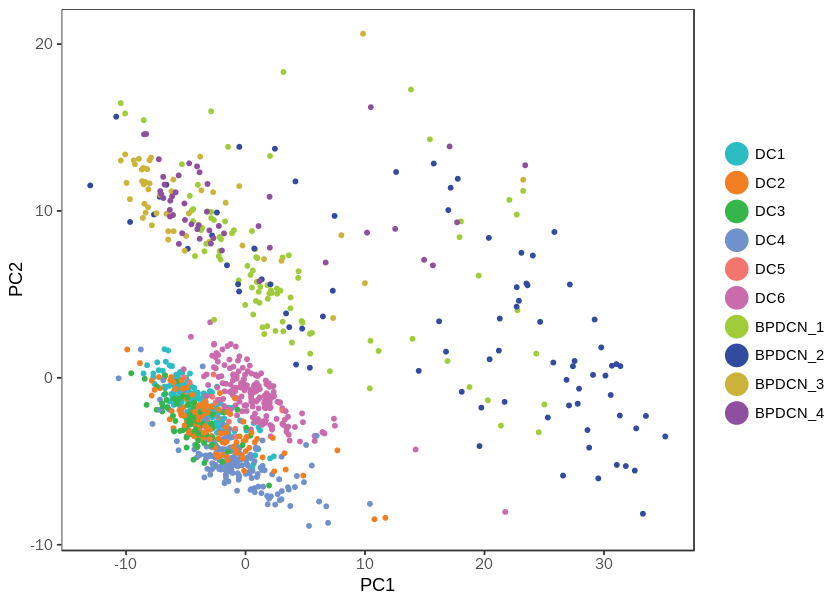

In [170]:
options(repr.plot.width=7, repr.plot.height=5,repr.plot.res = 120)
DimPlot(dcdat2,reduction.use = 'pca',group.by = 'new.label',cols.use = c(mcols[1:6],'#A0CC3A','#324B9F','#CCB339','#8E4F9E'))

### Reproduction by removing batch effect

In [171]:
N = c(length(grep(colnames(data2),pattern = 'BPDCN1',fixed =T)),
      length(grep(colnames(data2),pattern = 'BPDCN2',fixed =T)),
      length(grep(colnames(data2),pattern = 'BPDCN3',fixed =T)),
      length(grep(colnames(data2),pattern = 'BPDCN4',fixed =T)))

In [172]:
sum(N)

[1] 269

In [173]:
BPDCN = data2[,grep(colnames(data2),pattern = 'BPDCN',fixed =T)]

In [174]:
seu.BPDCN = CreateSeuratObject(raw.data = log(BPDCN+1),project = 'BPDCN')

In [175]:
seu.BPDCN@meta.data$calculated.label = rep(c('BPDCN_1','BPDCN_2','BPDCN_3','BPDCN_4'),N)
seu.BPDCN@meta.data$given.label = seu.BPDCN@meta.data$calculated.label

NormalizeData has not been run, therefore ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.
ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.


Scaling data matrix


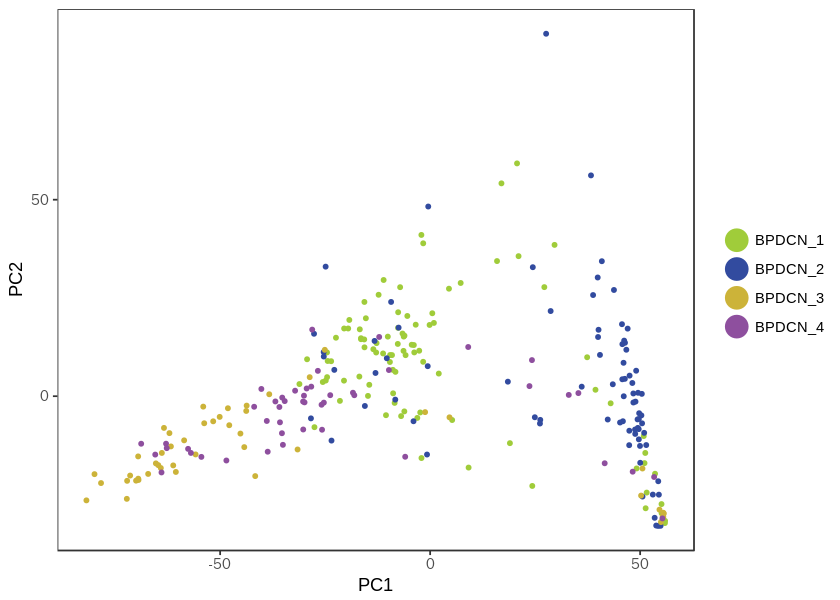

In [176]:
seu.BPDCN = ScaleData(seu.BPDCN,do.scale = T)
seu.BPDCN = RunPCA(seu.BPDCN,pc.genes = row.names(seu.BPDCN@data),do.print = F)
DimPlot(seu.BPDCN,reduction.use = 'pca',group.by = 'calculated.label',cols.use = c('#A0CC3A','#324B9F','#CCB339','#8E4F9E'))

NormalizeData has not been run, therefore ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.
ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.


Regressing out: calculated.label



Time Elapsed:  25.8701226711273 secs

Scaling data matrix


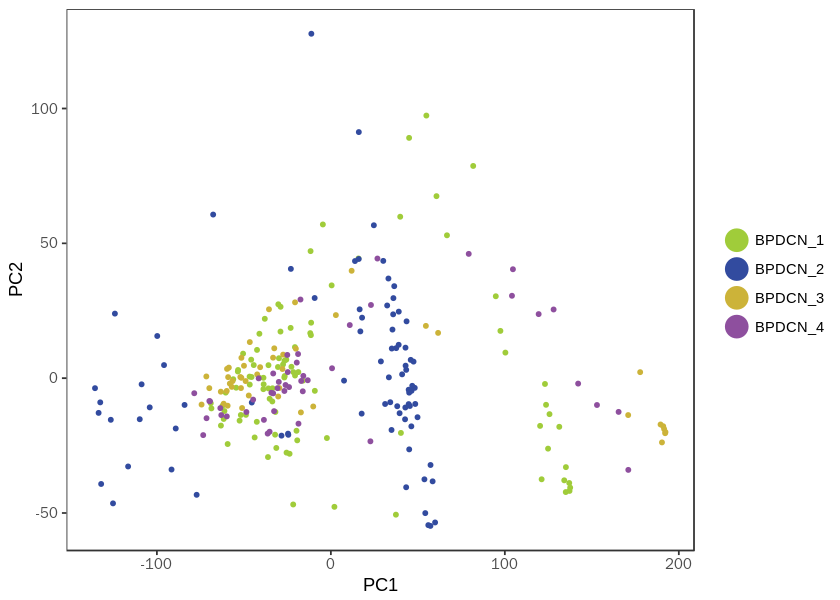

In [177]:
seu.BPDCN = ScaleData(seu.BPDCN,vars.to.regress = 'calculated.label',do.scale = F)
seu.BPDCN = RunPCA(seu.BPDCN,pc.genes = row.names(seu.BPDCN@data),do.print = F)
DimPlot(seu.BPDCN,reduction.use = 'pca',group.by = 'calculated.label',cols.use = c('#A0CC3A','#324B9F','#CCB339','#8E4F9E'))

In [185]:
var(seu.BPDCN@data[,1])

[1] 1.559414

In [186]:
dcdat11 = ScaleData(dcdat,do.scale = F)

NormalizeData has not been run, therefore ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.
ScaleData is running on non-normalized values. Recommended workflow is to run NormalizeData first.


Scaling data matrix


In [187]:
dcdat22 = MergeSeurat(object1 = dcdat11,object2 = seu.BPDCN,do.scale = T,do.center = T)

Scaling data matrix


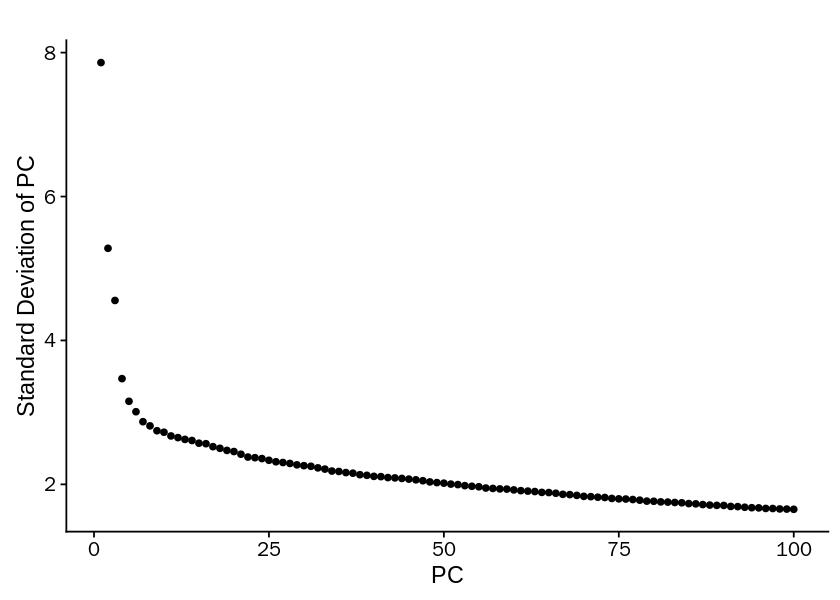

In [189]:
dcdat22 = RunPCA(dcdat2,pcs.compute = 100,do.print = F)
PCElbowPlot(dcdat22,num.pc = 100)

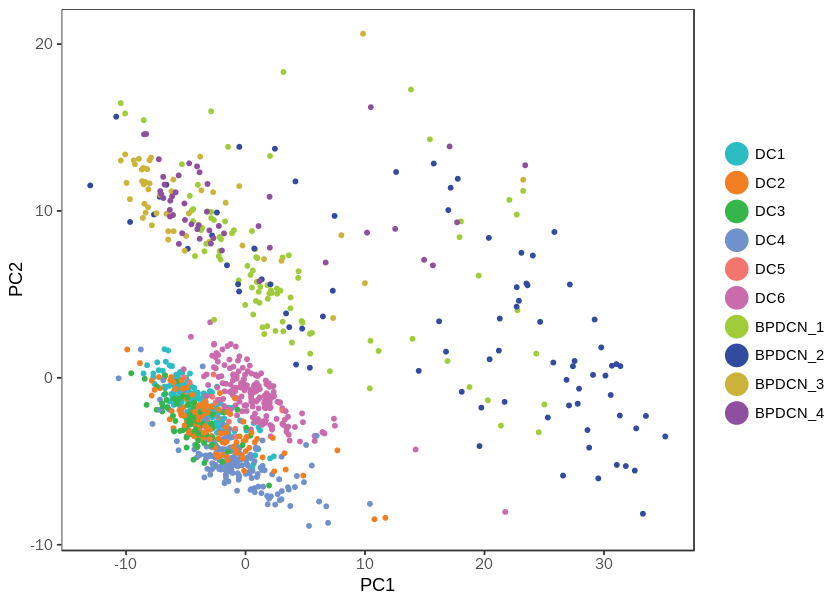

In [190]:
DimPlot(dcdat22,reduction.use = 'pca',group.by = 'new.label',cols.use = c(mcols[1:6],'#A0CC3A','#324B9F','#CCB339','#8E4F9E'))